# Primeiro Passo: Download do pdf.

In [1]:
import requests

# Baixar o PDF de uma URL
url = 'https://population.un.org/wpp/assets/Files/WPP2019_Highlights.pdf'
response = requests.get(url)

# Salvar localmente
with open('arquivo.pdf', 'wb') as f:
    f.write(response.content)


# Segundo Passo: Extração de Dados

## Essa etapa será dividida em:

* Configuração do Ambiente
* Extrair Texto do PDF
* Extrair Tabelas do PDF
* Extrair Imagens e Fazer OCR
* Salvar os Resultados

# Configuração do Ambiente

In [2]:
!pip install pymupdf
!pip install pdfplumber
!pip install pytesseract
!pip install pandas
!pip install pillow
!apt-get install tesseract-ocr
!pip install paddlepaddle
!pip install paddleocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.5/42.5 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.2/48.2 kB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.5/59.5 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 47.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 56.7 MB/s eta 0:00:00
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 29 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-en

# Dependencias, Bibliotecas e Arquivos que serão usados

In [3]:
import fitz
import pdfplumber
import pytesseract
import pandas as pd
import nltk
from nltk.corpus import stopwords
import re
from PIL import Image
import io
import seaborn as sns
import os
import string
import cv2
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
from collections import Counter
from wordcloud import WordCloud
from itertools import combinations
from sklearn.cluster import KMeans
from scipy import stats
from transformers import BlipProcessor, BlipForConditionalGeneration
from paddleocr import PaddleOCR

# Extração de Texto

### Extrai o texto de um arquivo PDF

Esta função percorre todas as páginas de um documento PDF e extrai o texto presente em cada página. O texto extraído de todas as páginas é concatenado e retornado como uma única string.

#### Parâmetros:
- `pdf_path` (str): O caminho para o arquivo PDF a ser processado.

#### Retorna:
- `str`: Uma string contendo todo o texto extraído do PDF.

#### Exceções:
- Levanta um erro se o caminho do arquivo PDF não for válido ou se houver algum problema ao abrir o PDF.
- Levanta um erro se a biblioteca `fitz` (PyMuPDF) não estiver instalada ou não puder ser importada.


In [4]:
def extract_text(pdf_path):
    doc = fitz.open(pdf_path)
    text = ""
    for page in doc:
        text += page.get_text()
    return text

In [21]:
text = extract_text('arquivo.pdf')
print(text[:500])

World
Population
Prospects
2019
Highlights
ST/ESA/SER.A/423
Department of Economic and Social Affairs
Population Division
World Population Prospects 2019 
Highlights
	
	
	
United Nations
	
New York, 2019
The Department of Economic and Social Affairs of the United Nations Secretariat is a vital interface between 
global policies in the economic, social and environmental spheres and national action. The Department 
works in three main interlinked areas: (i) it compiles, generates and analyses a wi


## Identificando Fontes, Pesos, estilos e cores do texto

### Extrai texto e estilos de um arquivo PDF

Esta função percorre todas as páginas de um documento PDF e extrai tanto o texto quanto os estilos associados a ele. Para cada trecho de texto, os estilos (como fonte, tamanho e cor) são capturados e retornados junto com o texto extraído.

#### Parâmetros:
- `pdf_path` (str): O caminho para o arquivo PDF a ser processado.

#### Retorna:
- `tuple`: Uma tupla contendo:
  - `text` (str): Uma string com todo o texto extraído do PDF.
  - `styles` (list): Uma lista de dicionários, onde cada dicionário contém os estilos associados a cada parte do texto extraído. Cada dicionário inclui as chaves:
    - `font`: O nome da fonte.
    - `size`: O tamanho da fonte.
    - `color`: A cor da fonte.

#### Exceções:
- Levanta um erro se o caminho do arquivo PDF não for válido ou se houver um problema ao abrir o PDF.
- Levanta um erro se a biblioteca `fitz` (PyMuPDF) não estiver instalada ou não puder ser importada.



In [5]:
def extract_text_with_styles(pdf_path):
    doc = fitz.open(pdf_path)
    text = ""
    styles = []

    for page in doc:
        for block in page.get_text("dict")["blocks"]:
            if block["type"] == 0:
                for line in block["lines"]:
                    for span in line["spans"]:
                        text += span["text"] + " "
                        styles.append({
                            "font": span["font"],
                            "size": span["size"],
                            "color": span["color"]
                        })

    return text, styles

In [24]:
text, styles = extract_text_with_styles("arquivo.pdf")
print(text[:100])
print(styles[:100])

World Population Prospects 2019 Highlights ST/ESA/SER.A/423 Department of Economic and Social Affair
[{'font': 'Roboto-Bold', 'size': 42.0, 'color': 16777215}, {'font': 'Roboto-Bold', 'size': 42.0, 'color': 16777215}, {'font': 'Roboto-Bold', 'size': 42.0, 'color': 16777215}, {'font': 'Roboto-Bold', 'size': 42.0, 'color': 16777215}, {'font': 'Roboto-Regular', 'size': 24.0, 'color': 16777215}, {'font': 'Roboto-Regular', 'size': 12.0, 'color': 2301728}, {'font': 'Roboto-Regular', 'size': 12.0, 'color': 2301728}, {'font': 'Roboto-Regular', 'size': 12.0, 'color': 2301728}, {'font': 'Roboto-Bold', 'size': 24.0, 'color': 2301728}, {'font': 'Roboto-Italic', 'size': 18.0, 'color': 2301728}, {'font': 'MyriadPro-Regular', 'size': 9.0, 'color': 2301728}, {'font': 'Roboto-Regular', 'size': 9.0, 'color': 2301728}, {'font': 'Roboto-Regular', 'size': 9.0, 'color': 2301728}, {'font': 'Roboto-Regular', 'size': 12.0, 'color': 2301728}, {'font': 'Roboto-Regular', 'size': 12.0, 'color': 2301728}, {'font': 

## Extracão por Tamanho, Fonte e Estilo

### Extrai texto com base no tamanho, fonte e estilo de um arquivo PDF

Esta funções percorre todas as páginas de um documento PDF e extrai o texto correspondente a um tamanho de fonte específico. Para cada trecho de texto, a função também retorna os detalhes do estilo (tamanho, fonte e cor).

#### Parâmetros:
- `pdf_path` (str): O caminho para o arquivo PDF a ser processado.
- `arg` (float or string): O tamanho,fonte e estilo para o qual o texto deve ser extraído.

#### Retorna:
- `tuple`: Uma tupla contendo:
  - `text` (str): Uma string com todo o texto extraído com o tamanho de fonte especificado.
  - `sections` (list): Uma lista de dicionários, onde cada dicionário contém os detalhes do trecho de texto extraído, incluindo:
    - `text`: O trecho de texto extraído.
    - `size`: O tamanho da fonte.
    - `font`: O nome da fonte.
    - `color`: A cor da fonte.

#### Exceções:
- Levanta um erro se o caminho do arquivo PDF não for válido ou se houver um problema ao abrir o PDF.
- Levanta um erro se a biblioteca `fitz` (PyMuPDF) não estiver instalada ou não puder ser importada.



In [26]:
def extract_text_by_size(pdf_path, size):
    doc = fitz.open(pdf_path)
    text = ""
    sections = []

    for page in doc:
        for block in page.get_text("dict")["blocks"]:
            if block["type"] == 0:
                for line in block["lines"]:
                    for span in line["spans"]:
                        if span["size"] == size:
                            text += span["text"] + " "
                            sections.append({
                                "text": span["text"],
                                "size": span["size"],
                                "font": span["font"],
                                "color": span["color"],
                            })

    return text, sections

def extract_text_by_font(pdf_path, target_font):
    doc = fitz.open(pdf_path)
    text = ""
    sections = []

    for page in doc:
        for block in page.get_text("dict")["blocks"]:
            if block["type"] == 0:
                for line in block["lines"]:
                    for span in line["spans"]:
                        if target_font in span["font"]:
                            text += span["text"] + " "
                            sections.append({
                                "text": span["text"],
                                "font": span["font"],
                                "size": span["size"],
                                "color": span["color"]
                            })

    return text, sections

def extract_text_by_style(pdf_path, style):
    doc = fitz.open(pdf_path)
    text = ""
    sections = []

    for page in doc:
        for block in page.get_text("dict")["blocks"]:
            if block["type"] == 0:
                for line in block["lines"]:
                    for span in line["spans"]:
                        if style.lower() in span["font"].lower():
                            text += span["text"] + " "
                            sections.append({
                                "text": span["text"],
                                "font": span["font"],
                                "size": span["size"],
                                "color": span["color"]
                            })

    return text, sections

In [27]:
text, sections = extract_text_by_size("arquivo.pdf", 12)
text1, sections1 = extract_text_by_font("arquivo.pdf", "Roboto")
text2, sections2 = extract_text_by_style("arquivo.pdf", "Bold")

### Extrai dados de texto e estilo de um arquivo PDF

Esta função percorre todas as páginas de um documento PDF e extrai o texto, juntamente com os detalhes de estilo (fonte, tamanho, cor) e a página em que cada trecho de texto aparece. Os dados são retornados como uma lista de dicionários, onde cada dicionário contém o texto e os estilos associados, bem como o número da página.

#### Parâmetros:
- `pdf_path` (str): O caminho para o arquivo PDF a ser processado.

#### Retorna:
- `list`: Uma lista de dicionários, onde cada dicionário contém:
  - `text` (str): O trecho de texto extraído.
  - `font` (str): O nome da fonte do texto.
  - `size` (float): O tamanho da fonte do texto.
  - `color` (int): A cor da fonte (geralmente representada como um valor inteiro RGB).
  - `page` (int): O número da página em que o texto foi encontrado.

#### Exceções:
- Levanta um erro se o caminho do arquivo PDF não for válido ou se houver um problema ao abrir o PDF.
- Levanta um erro se a biblioteca `fitz` (PyMuPDF) não estiver instalada ou não puder ser importada.


In [7]:
def extract_pdf_data(pdf_path):
    doc = fitz.open(pdf_path)
    sections = []

    for page_num, page in enumerate(doc):
        for block in page.get_text("dict")['blocks']:
            if block['type'] == 0:
                for line in block['lines']:
                    for span in line['spans']:
                        sections.append({
                            "text": span['text'],
                            "font": span['font'],
                            "size": span['size'],
                            "color": span['color'],
                            "page": page_num + 1
                        })

    return sections

In [ ]:
sections = extract_pdf_data("arquivo.pdf")
for section in sections:
    print(f"Texto: {section['text']}")
    print(f"Fonte: {section['font']}")
    print(f"Tamanho: {section['size']}")
    print(f"Cor: {section['color']}")
    print(f"Página: {section['page']}")


## Salvar extracões

In [8]:
def save_to_txt(filename, sections):
    with open(filename, "w", encoding="utf-8") as f:
        f.write("Detalhes das Seções:\n")
        for section in sections:
            f.write(f"Texto: {section['text']}\n")
            f.write(f"Fonte: {section['font']}, Tamanho: {section['size']}, Cor: {section['color']}, Página: {section['page']}\n")
            f.write("-" * 50 + "\n")


## Graficos

In [9]:
def plot_bar_chart(data, title, xlabel, ylabel, filename):
    labels, values = zip(*Counter(data).items())
    plt.figure(figsize=(10, 6))
    plt.bar(labels, values, color='skyblue')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    plt.savefig(filename)
    plt.close()

def plot_pie_chart(data, title, filename):
    labels, values = zip(*Counter(data).items())
    total = sum(values)
    legend_labels = [f"{label} - {value / total:.1%}" for label, value in zip(labels, values)]
    plt.figure(figsize=(8, 8))
    wedges, _ = plt.pie(values, startangle=140, colors=sns.color_palette("Set2"))
    plt.legend(wedges, legend_labels, title="Fontes", loc="center left", bbox_to_anchor=(1, 0.5))
    plt.title(title)
    plt.tight_layout()
    plt.show()
    plt.savefig(filename)
    plt.close()



def plot_sequence_chart(sections, filename):
    plt.figure(figsize=(12, 6))
    sizes = [sec["size"] for sec in sections]
    plt.plot(sizes, marker='o', linestyle='-', color='purple')
    plt.title("Sequência de Hierarquia do Documento")
    plt.xlabel("Ordem de Aparição")
    plt.ylabel("Tamanho da Fonte")
    plt.tight_layout()
    plt.show()
    plt.savefig(filename)
    plt.close()

def plot_heatmap(sections, filename):
    data = [(sec["font"], sec["size"]) for sec in sections]
    font_size_counts = Counter(data)

    fonts = list(set(font for font, _ in data))
    sizes = list(set(size for _, size in data))

    heatmap_data = [[font_size_counts.get((font, size), 0) for size in sizes] for font in fonts]

    plt.figure(figsize=(12, 8))
    sns.heatmap(heatmap_data, xticklabels=sizes, yticklabels=fonts, cmap="YlGnBu", annot=True, fmt="d")
    plt.title("Correlação entre Fonte e Tamanho")
    plt.xlabel("Tamanho da Fonte")
    plt.ylabel("Fonte")
    plt.tight_layout()
    plt.show()
    plt.savefig(filename)
    plt.close()

def plot_heatmap_temp(matrix, x_labels, y_labels, title, filename):
    plt.figure(figsize=(12, 8))
    sns.heatmap(matrix, annot=True, fmt=".0f", cmap="YlGnBu", xticklabels=x_labels, yticklabels=y_labels)
    plt.title(title)
    plt.tight_layout()
    plt.show()
    plt.savefig(filename)
    plt.close()

def detect_repeated_texts(sections, filename):
    text_counts = Counter(sec["text"] for sec in sections if len(sec["text"]) > 5)
    repeated_texts = {text: count for text, count in text_counts.items() if count > 1}

    with open(filename, "w", encoding="utf-8") as f:
        f.write("Textos Repetidos:\n")
        for text, count in repeated_texts.items():
            f.write(f"{text} - {count} vezes\n")

def plot_word_length_by_style(sections, filename):
    style_word_lengths = {sec["font"]: [len(word) for word in sec["text"].split()] for sec in sections}

    data = [(font, length) for font, lengths in style_word_lengths.items() for length in lengths]
    df = pd.DataFrame(data, columns=["Font", "Length"])

    plt.figure(figsize=(12, 8))
    sns.boxplot(x="Font", y="Length", data=df)
    plt.title("Comprimento de Palavras por Estilo")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    plt.savefig(filename)
    plt.close()

def plot_font_similarity(sections, filename):
    font_pairs = [(sec1["font"], sec2["font"]) for sec1, sec2 in combinations(sections, 2) if sec1["size"] == sec2["size"]]
    pair_counts = Counter(font_pairs)

    fonts = list(set(font for font, _ in font_pairs))

    similarity_matrix = pd.DataFrame(0, index=fonts, columns=fonts)

    for (font1, font2), count in pair_counts.items():
        similarity_matrix.at[font1, font2] += count
        similarity_matrix.at[font2, font1] += count

    plt.figure(figsize=(12, 8))
    sns.heatmap(similarity_matrix, cmap="YlOrRd", annot=True, fmt="d")
    plt.title("Similaridade entre Fontes")
    plt.tight_layout()
    plt.show()
    plt.savefig(filename)
    plt.close()

def generate_wordcloud(text, filename):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    plt.savefig(filename)
    plt.close()



## Requisitos do Teste



### Conta o número de palavras e sentenças em um conjunto de seções extraídas de um PDF

Esta função recebe uma lista de seções de texto extraídas de um arquivo PDF e conta o total de palavras e sentenças em todas as seções. Ela divide o texto em palavras e usa expressões regulares para identificar as sentenças.

#### Parâmetros:
- `sections` (list): Uma lista de dicionários que contêm os detalhes do texto extraído de um PDF. Cada dicionário deve ter, no mínimo, a chave `text`, que contém o texto da seção.

#### Retorna:
- `tuple`: Uma tupla contendo:
  - `total_words` (int): O número total de palavras encontradas em todas as seções.
  - `total_sentences` (int): O número total de sentenças encontradas em todas as seções.

#### Exceções:
- Levanta um erro se o argumento `sections` não for uma lista de dicionários ou se algum item na lista não contiver a chave `text`.


In [28]:
def count_words_and_sentences(sections):
    total_words = 0
    total_sentences = 0

    for section in sections:
        text = section["text"]
        words = text.split()
        sentences = re.split(r'[.!?]', text)

        total_words += len(words)
        total_sentences += len(sentences)

    return total_words, total_sentences

### Conta o número de palavras de parada (stopwords) em um conjunto de seções extraídas de um PDF

Esta função recebe uma lista de seções de texto extraídas de um arquivo PDF e conta o número de palavras de parada (stopwords) presentes no texto. As stopwords são palavras comuns, como artigos, preposições e pronomes, que geralmente são ignoradas em análises de texto.

#### Parâmetros:
- `sections` (list): Uma lista de dicionários que contêm os detalhes do texto extraído de um PDF. Cada dicionário deve ter, no mínimo, a chave `text`, que contém o texto da seção.

#### Retorna:
- `tuple`: Uma tupla contendo:
  - `stopword_count` (int): O número total de stopwords encontradas no texto de todas as seções.
  - `total_words` (int): O número total de palavras encontradas em todas as seções.

#### Exceções:
- Levanta um erro se o argumento `sections` não for uma lista de dicionários ou se algum item na lista não contiver a chave `text`.
- Levanta um erro se a variável `stop_words` não estiver definida previamente, já que ela contém a lista de stopwords.



In [29]:
def check_stopwords(sections):
    stopword_count = 0
    all_words = []

    for section in sections:
        text = section["text"]
        words = text.split()
        all_words.extend(words)

    for word in all_words:
        if word.lower() in stop_words:
            stopword_count += 1

    return stopword_count, len(all_words)

### Detecta caracteres inválidos em um conjunto de seções extraídas de um PDF

Esta função recebe uma lista de seções de texto extraídas de um arquivo PDF e verifica a presença de caracteres inválidos nas palavras. Um caractere é considerado inválido se não corresponder a letras do alfabeto, acentos ou caracteres especiais permitidos, como cedilha e til.

#### Parâmetros:
- `sections` (list): Uma lista de dicionários que contêm os detalhes do texto extraído de um PDF. Cada dicionário deve ter, no mínimo, a chave `text`, que contém o texto da seção.

#### Retorna:
- `int`: O número de palavras que contêm caracteres inválidos.

#### Exceções:
- Levanta um erro se o argumento `sections` não for uma lista de dicionários ou se algum item na lista não contiver a chave `text`.

#### Funcionamento:
A função usa uma expressão regular para verificar se as palavras contêm apenas caracteres alfabéticos (inclusive letras com acentos, til e cedilha) e espaços. Se uma palavra não corresponder a esse padrão, ela é considerada inválida.



In [30]:
def detect_invalid_characters(sections):
    invalid_count = 0
    all_words = []

    for section in sections:
        text = section["text"]
        words = text.split()
        all_words.extend(words)

    valid_pattern = re.compile("^[a-zA-Záéíóúãõàèìòùãáç\s]+$")
    for word in all_words:
        if not valid_pattern.match(word):
            invalid_count += 1

    return invalid_count



### Identifica os termos mais frequentes em um conjunto de seções extraídas de um PDF

Esta função recebe uma lista de seções de texto extraídas de um arquivo PDF e retorna os **n** termos mais frequentes (palavras) no texto. A frequência é calculada com base no número de vezes que cada palavra aparece nas seções. O valor de **n** pode ser ajustado para obter mais ou menos termos.

#### Parâmetros:
- `sections` (list): Uma lista de dicionários que contêm os detalhes do texto extraído de um PDF. Cada dicionário deve ter, no mínimo, a chave `text`, que contém o texto da seção.
- `n` (int, opcional): O número de termos mais frequentes a serem retornados. O valor padrão é 10.

#### Retorna:
- `list`: Uma lista de tuplas, onde cada tupla contém:
  - `termo` (str): A palavra ou termo mais frequente.
  - `contagem` (int): O número de vezes que o termo aparece.

#### Exceções:
- Levanta um erro se o argumento `sections` não for uma lista de dicionários ou se algum item na lista não contiver a chave `text`.



In [31]:
def identify_frequent_terms(sections, n=10):
    all_words = []

    for section in sections:
        text = section["text"]
        words = text.split()
        all_words.extend(words)

    word_counts = Counter(all_words)
    return word_counts.most_common(n)

### Limpa o texto removendo palavras inválidas e stopwords

Esta função recebe um texto e limpa as palavras, removendo aquelas que contêm caracteres inválidos ou que estão na lista de stopwords. As palavras válidas são convertidas para minúsculas e mantidas em uma lista para posterior processamento.

#### Parâmetros:
- `text` (str): O texto a ser processado.

#### Retorna:
- `list`: Uma lista contendo as palavras válidas do texto, em minúsculas, sem caracteres inválidos ou stopwords.

#### Exceções:
- Levanta um erro se o argumento `text` não for uma string.

#### Funcionamento:
A função usa uma expressão regular para verificar se as palavras contêm apenas letras (de A-Z, a-z), acentos, til e cedilha, além de espaços. Palavras que não atendem a esse padrão ou que estão na lista `stop_words` são removidas.


In [32]:
def clean_text(text):
    valid_pattern = re.compile("^[a-zA-Záéíóúãõàèìòùãáç\s]+$")
    words = text.split()

    cleaned_words = []
    for word in words:
        word = word.lower()

        if valid_pattern.match(word) and word not in stop_words:
            cleaned_words.append(word)

    return cleaned_words



## Requisitos do Teste

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Quantidade de palavras extraídas: 15065
Quantidade de frases extraídas: 3125
Quantidade de stopwords encontradas: 5193 de um total de 15065 palavras.
Quantidade de palavras com caracteres inválidos: 3022
Termos mais frequentes:
the: 785
and: 666
of: 643
in: 406
to: 372
population: 211
Population: 178
is: 137
countries: 125
per: 123


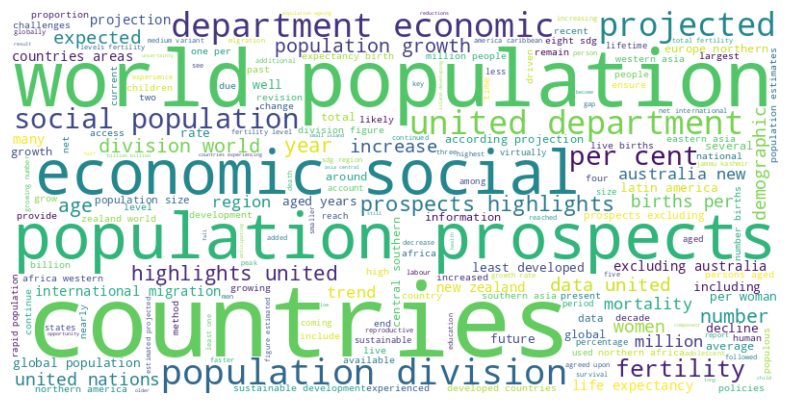

In [33]:
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

pdf_path = "arquivo.pdf"
sections = extract_pdf_data(pdf_path)

# 1. Quantidade de palavras e frases extraídas
total_words, total_sentences = count_words_and_sentences(sections)
print(f"Quantidade de palavras extraídas: {total_words}")
print(f"Quantidade de frases extraídas: {total_sentences}")

# 2. Verificar a presença de stopwords
stopword_count, total_words = check_stopwords(sections)
print(f"Quantidade de stopwords encontradas: {stopword_count} de um total de {total_words} palavras.")

# 3. Verificar caracteres inválidos
invalid_count = detect_invalid_characters(sections)
print(f"Quantidade de palavras com caracteres inválidos: {invalid_count}")

# 4. Identificar termos mais frequentes
frequent_terms = identify_frequent_terms(sections)
print("Termos mais frequentes:")
for term, count in frequent_terms:
    print(f"{term}: {count}")

# Gerar uma nuvem de palavras com termos extraídos
full_text = " ".join(" ".join(clean_text(sec["text"])) for sec in sections)
generate_wordcloud(full_text, "nuvem_palavras.png")

## Analise detalhadas

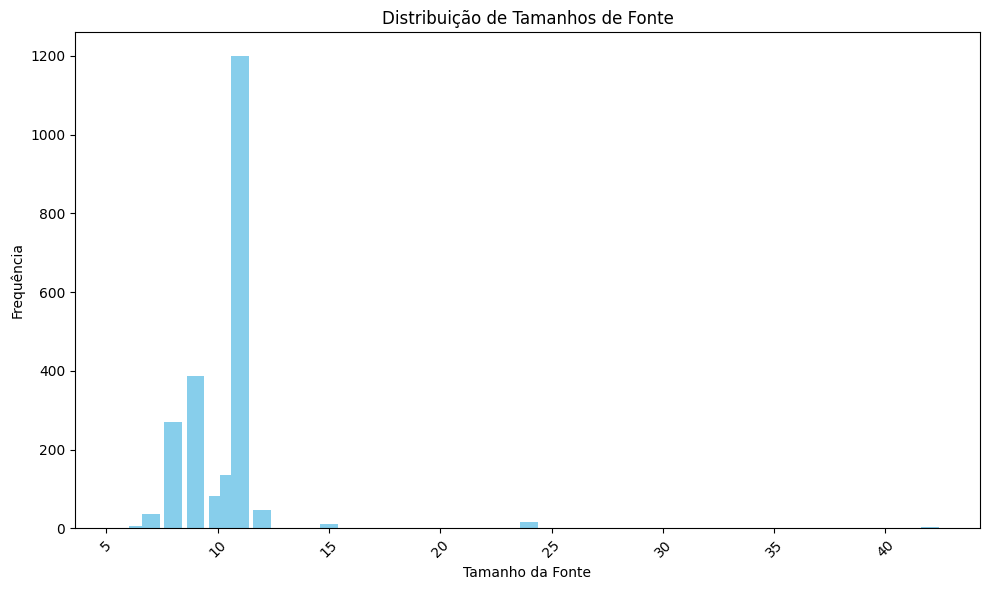

<Figure size 640x480 with 0 Axes>

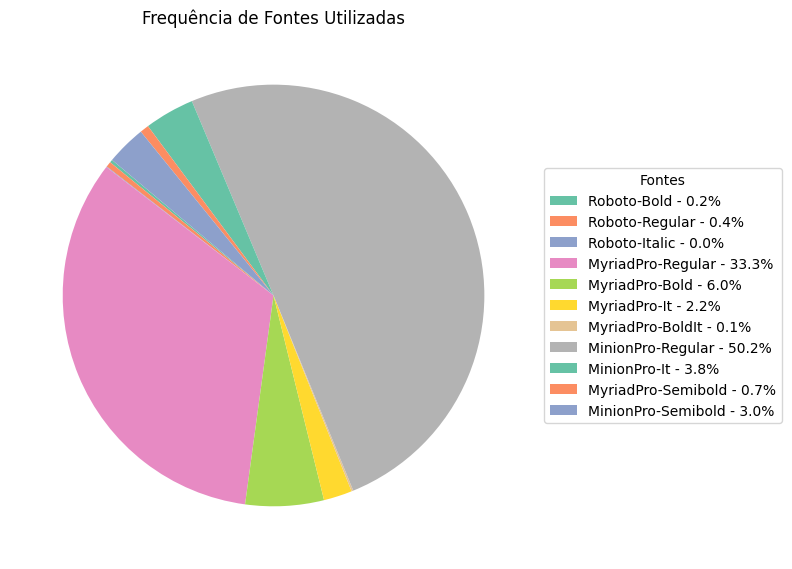

<Figure size 640x480 with 0 Axes>

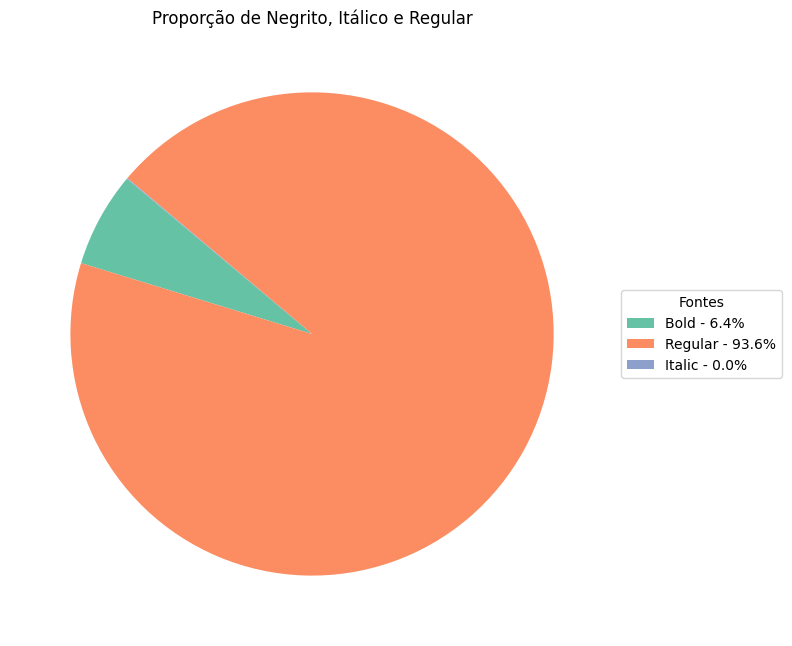

<Figure size 640x480 with 0 Axes>

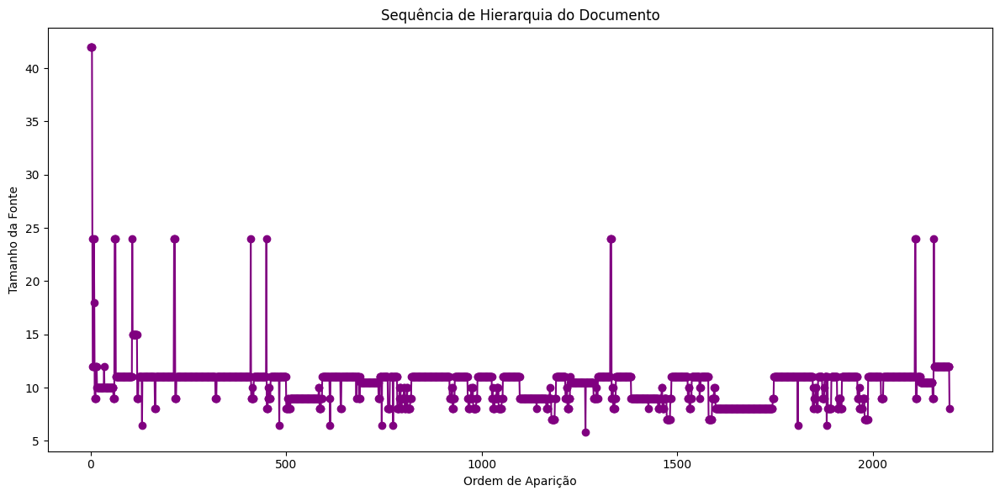

<Figure size 640x480 with 0 Axes>

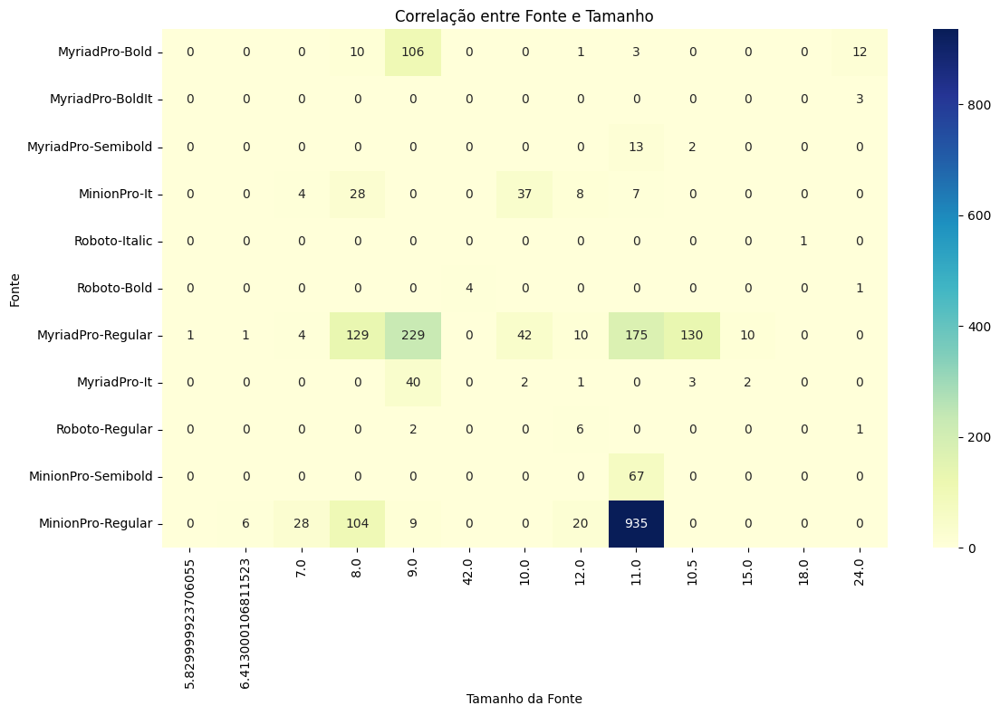

<Figure size 640x480 with 0 Axes>

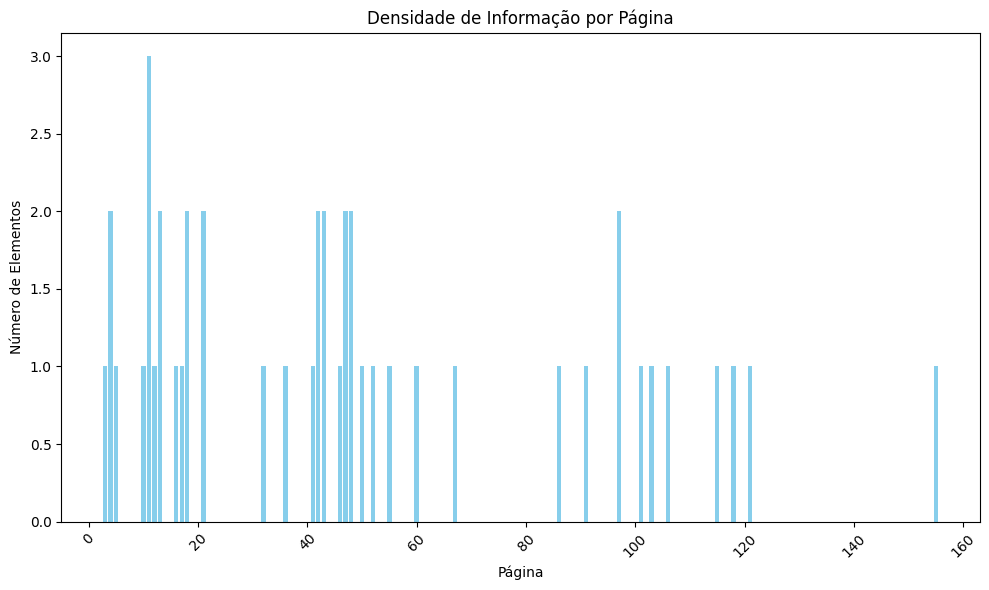

<Figure size 640x480 with 0 Axes>

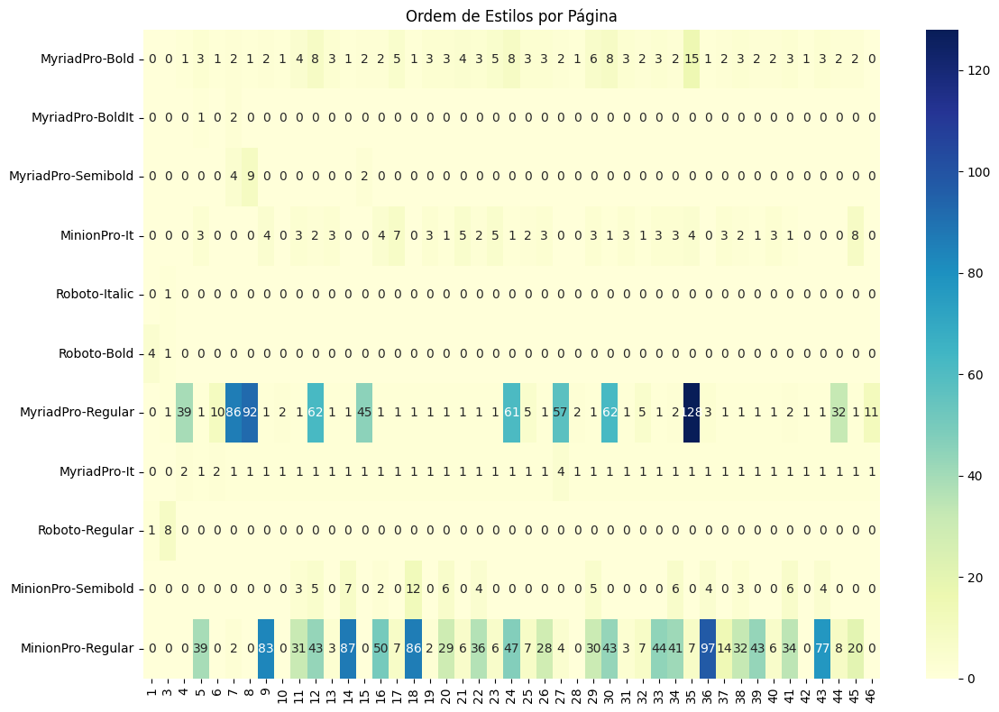

<Figure size 640x480 with 0 Axes>

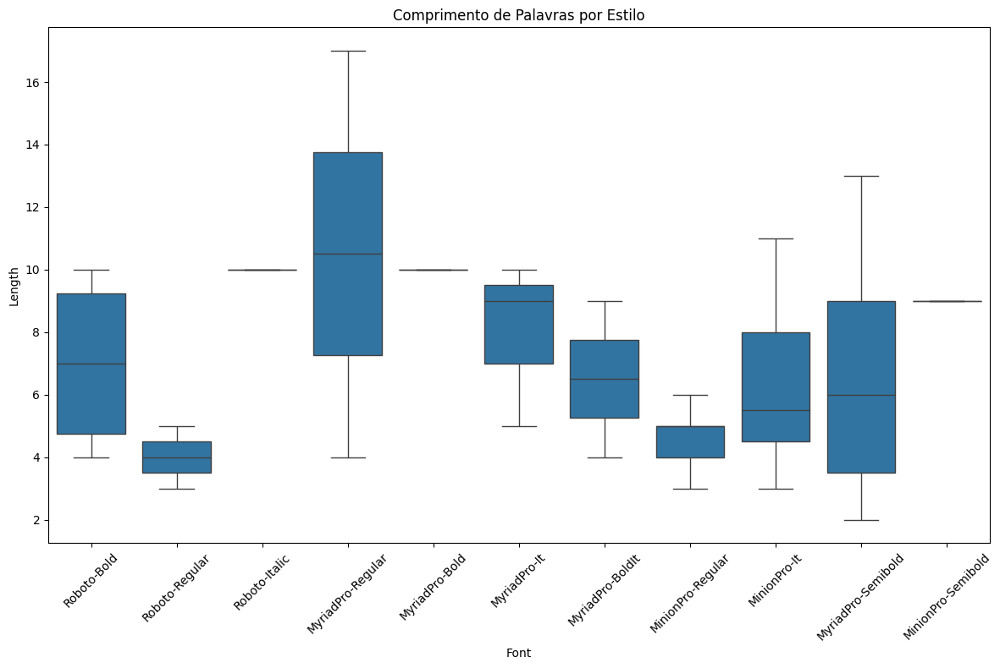

<Figure size 640x480 with 0 Axes>

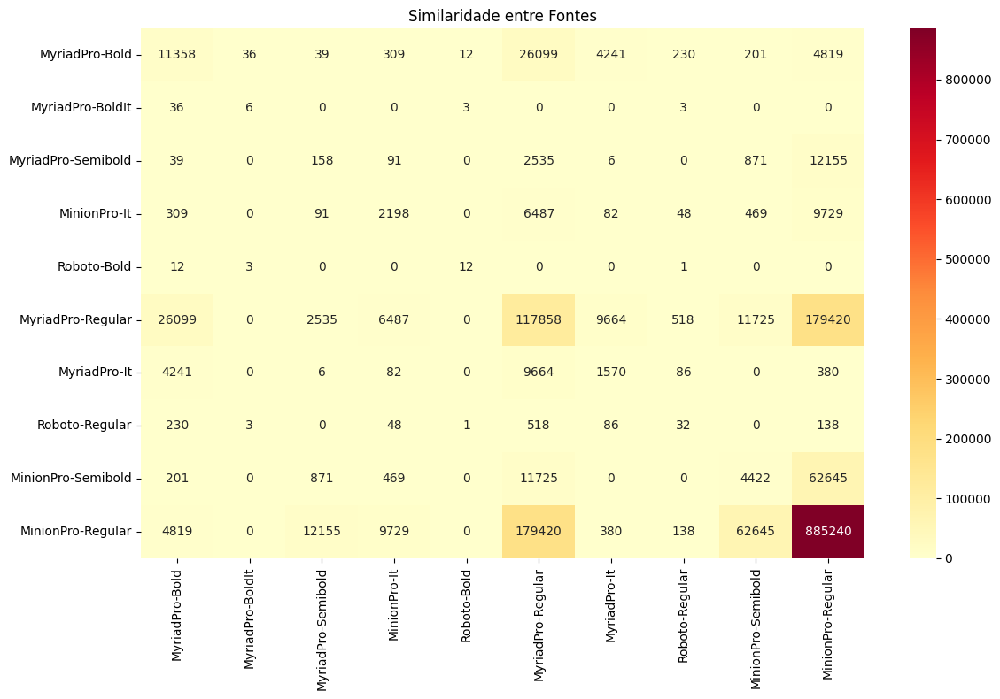

<Figure size 640x480 with 0 Axes>

In [34]:
pdf_path = "arquivo.pdf"
sections = extract_pdf_data(pdf_path)
save_to_txt("extracao_detalhada.txt", sections)

# Distribuição de tamanhos de fonte
sizes = [sec["size"] for sec in sections]
plot_bar_chart(sizes, "Distribuição de Tamanhos de Fonte", "Tamanho da Fonte", "Frequência", "tamanho_fonte.png")
plt.tight_layout()

# Frequência de fontes utilizadas
fonts = [sec["font"] for sec in sections]
plot_pie_chart(fonts, "Frequência de Fontes Utilizadas", "frequencia_fontes.png")
plt.tight_layout()

# Identificação de padrões por estilo
styles = ["Bold" if "Bold" in sec["font"] else "Italic" if "Italic" in sec["font"] else "Regular" for sec in sections]
plot_pie_chart(styles, "Proporção de Negrito, Itálico e Regular", "proporcao_estilos.png")
plt.tight_layout()

# Sequência de hierarquia do documento
plot_sequence_chart(sections, "hierarquia_documento.png")
plt.tight_layout()

# Correlação entre fonte e tamanho (Mapa de Calor)
plot_heatmap(sections, "correlacao_fonte_tamanho.png")
plt.tight_layout()

# Densidade de Informação por Página
density = Counter(sec['page'] for sec in sections)
plot_bar_chart(density.values(), "Densidade de Informação por Página", "Página", "Número de Elementos", "densidade.png")
plt.tight_layout()

# Análise Temporal (Ordem de Estilos)
font_timeline = [(sec['page'], sec['font']) for sec in sections]
font_timeline_matrix = np.zeros((len(set(fonts)), len(set(density.keys()))))
for page, font in font_timeline:
    font_idx = list(set(fonts)).index(font)
    page_idx = list(set(density.keys())).index(page)
    font_timeline_matrix[font_idx][page_idx] += 1
plot_heatmap_temp(font_timeline_matrix, sorted(density.keys()), list(set(fonts)), "Ordem de Estilos por Página", "fonte_temporal.png")
plt.tight_layout()

# Texto Repetidos
detect_repeated_texts(sections, "textos_repetidos.txt")

# Comprimento das palavras
plot_word_length_by_style(sections, "comprimento_palavras.png")
plt.tight_layout()

# Similaridades
plot_font_similarity(sections, "similaridade_fontes.png")
plt.tight_layout()



# Extração de Tabelas

In [60]:
def extract_tables(pdf_path):
    tables = []
    with pdfplumber.open(pdf_path) as pdf:
        for page in pdf.pages:
            page_tables = page.extract_tables()
            for table in page_tables:
                tables.append(pd.DataFrame(table[1:], columns=table[0]))
    return tables

## Requisitos do Teste

In [61]:
tables = extract_tables(pdf_path)

## Exibindo estatísticas descritivas

In [62]:
for table in tables:
    print(table.describe())


               Population (millions)  None  None  None
count       14                    14    14    14    14
unique      14                    14    14    14    14
top     Region                  2019  2030  2050  2100
freq         1                     1     1     1     1
       Region 2019  2030 2050  2100
count      13   13    13   13    13
unique     13   12    13   12    13
top     World  8.7  11.7  6.4  22.6
freq        1    2     1    2     1
               Average number of live births per woman None None None
count       14                                      14   14   14   14
unique      14                                      13   11   11    7
top     Region                                     3.2  3.9  1.7  1.7
freq         1                                       2    2    3    3
           Life expectancy at birth (years)     None         None  None  \
count   15                               15       14           14    15   
unique  14                               15  

##  Identificar Valores Ausentes

In [63]:
for table in tables:
    print(table.isnull().sum())

                         0
Population (millions)    0
None                     0
None                     0
None                     0
dtype: int64
Region    0
2019      0
2030      0
2050      0
2100      0
dtype: int64
                                           0
Average number of live births per woman    0
None                                       0
None                                       0
None                                       0
dtype: int64
                                    0
Life expectancy at birth (years)    0
None                                1
None                                1
None                                0
None                                1
None                                1
None                                0
None                                1
None                                1
dtype: int64
    0
dtype: int64


## Identificar Possíveis Outliers

In [64]:
for table in tables:
    print(table.dtypes)

                         object
Population (millions)    object
None                     object
None                     object
None                     object
dtype: object
Region    object
2019      object
2030      object
2050      object
2100      object
dtype: object
                                           object
Average number of live births per woman    object
None                                       object
None                                       object
None                                       object
dtype: object
                                    object
Life expectancy at birth (years)    object
None                                object
None                                object
None                                object
None                                object
None                                object
None                                object
None                                object
None                                object
dtype: object
    object
dtype: o

### Limpeza e Conversão

In [65]:
for table in tables:
    # Remover ou substituir "None" por NaN
    table.replace("None", pd.NA, inplace=True)

    # Remover quaisquer caracteres não numéricos, como vírgulas, e tentar converter para numérico
    table = table.apply(lambda x: x.replace(",", "") if isinstance(x, str) else x)  # Remove vírgulas de strings

    # Converter todas as colunas para numérico
    table = table.apply(pd.to_numeric, errors='coerce')  # 'coerce' transforma valores inválidos em NaN

    # Selecionar apenas as colunas numéricas
    numeric_columns = table.select_dtypes(include=['float64', 'int64']).columns

    if not numeric_columns.empty:
        # Calcular o IQR e os outliers
        Q1 = table[numeric_columns].quantile(0.25)
        Q3 = table[numeric_columns].quantile(0.75)
        IQR = Q3 - Q1
        outliers = ((table[numeric_columns] < (Q1 - 1.5 * IQR)) | (table[numeric_columns] > (Q3 + 1.5 * IQR))).sum()
        print(outliers)
    else:
        print("Nenhuma coluna numérica encontrada na tabela.")


                         0
Population (millions)    1
None                     1
None                     1
None                     1
None                     1
None                     1
None                     1
None                     1
None                     1
None                     1
dtype: int64
Region    0
2019      1
2030      0
2050      0
2100      0
dtype: int64
                                           0
Average number of live births per woman    1
None                                       1
None                                       1
None                                       1
None                                       1
None                                       1
None                                       1
None                                       1
None                                       1
None                                       1
dtype: int64
                                    0
Life expectancy at birth (years)    1
None                             

In [78]:
# Limpar "None" e valores não numéricos
for table in tables:
    # Substituir 'None' por NaN
    table.replace("None", pd.NA, inplace=True)

    # Remover qualquer linha que tenha apenas valores NaN
    table.dropna(how='all', inplace=True)

    # Remover colunas que não têm dados numéricos
    table.dropna(axis=1, how='all', inplace=True)

    # Ajustar a linha de cabeçalho se necessário (se a primeira linha for o cabeçalho correto)
    if not table.empty:  # Verifica se o DataFrame não está vazio
        table.columns = table.iloc[0]  # Define o cabeçalho como a primeira linha
        table = table.drop(0)  # Remove a primeira linha, pois agora é o cabeçalho

    # Converter todas as colunas para numérico, tentando lidar com os valores não numéricos
    for column in table.columns:
        if pd.api.types.is_object_dtype(table[column]):  # Verifica se a coluna é do tipo objeto (string)
            # Remover espaços extras ou caracteres não numéricos, como vírgulas
            table[column] = table[column].apply(lambda x: str(x).replace(",", "") if pd.notna(x) else x)

            # Converter para numérico e tratar erros
            table[column] = pd.to_numeric(table[column], errors='coerce')  # Coerce converte para NaN valores não numéricos

    # Exibir as primeiras linhas após a limpeza
    print(table.head())

# Exibindo histograma para cada coluna numérica
for table in tables:
    for column in table.select_dtypes(include=['float64', 'int64']).columns:
        if not table[column].isna().all():  # Verifica se a coluna não está toda com NaN
            table[column].hist(bins=20)
            plt.title(f'Distribuição de {column}')
            plt.xlabel(column)
            plt.ylabel('Frequência')
            plt.show()

# Exibindo boxplot para cada coluna numérica
for table in tables:
    for column in table.select_dtypes(include=['float64', 'int64']).columns:
        if not table[column].isna().all():  # Verifica se a coluna não está toda com NaN
            sns.boxplot(x=table[column])
            plt.title(f'Boxplot de {column}')
            plt.show()

0  Region   2019   2030   2050   2100
1     NaN    NaN    NaN    NaN    NaN
2     NaN    NaN    NaN    NaN    NaN
3     NaN  517.0  609.0  754.0  924.0
4     NaN    NaN    NaN    NaN    NaN
5     NaN    NaN    NaN    NaN    NaN
0  World   9.1  11.7  15.9  22.6
1    NaN   3.0   3.3   4.8  13.0
2    NaN   5.7   7.6  12.7  22.4
3    NaN   6.0   8.0  13.1  25.7
4    NaN  11.2  15.8  23.7  30.4
5    NaN   8.7  12.0  19.0  31.3
0  Region  1990  2019  2050  2100
1     NaN   3.2   2.5   2.2   1.9
2     NaN   6.3   4.6   3.1   2.1
3     NaN   4.4   2.9   2.2   1.9
4     NaN   4.3   2.4   1.9   1.7
5     NaN   2.5   1.8   1.8   1.8
0      1990     None         None  2019     None         None  2050     None  \
1 NaN   NaN  Females  Both\nsexes   NaN  Females  Both\nsexes   NaN  Females   
2 NaN  61.9     66.5         64.2  70.2     75.0         72.6  74.8     79.4   
3 NaN  47.7     51.1         49.4  59.3     62.9         61.1  66.3     70.8   
4 NaN  62.8     67.6         65.1  71.6     76.0  

# Extração de imagens e Aplicar o OCR

### Extrai todas as imagens de um arquivo PDF

Esta função percorre todas as páginas de um documento PDF e extrai as imagens incorporadas em cada uma. As imagens extraídas são armazenadas em uma lista como objetos de imagem (usando a biblioteca PIL).

#### Parâmetros:
- `pdf_path` (str): O caminho para o arquivo PDF a ser processado.

#### Retorna:
- `list`: Uma lista de objetos `Image` do PIL, onde cada objeto representa uma imagem extraída do PDF.

#### Exceções:
- Levanta um erro se o caminho do arquivo PDF não for válido ou se houver algum problema ao abrir o PDF.
- Levanta um erro se a biblioteca necessária (como `fitz` ou `PIL`) não estiver instalada ou não puder ser importada.



In [16]:
def extract_images(pdf_path):
    doc = fitz.open(pdf_path)
    images = []
    for page in doc:
        for img in page.get_images(full=True):
            xref = img[0]
            base_image = doc.extract_image(xref)
            image_bytes = base_image["image"]
            image = Image.open(io.BytesIO(image_bytes))
            images.append(image)
    return images

### Aplica OCR (Reconhecimento Óptico de Caracteres) nas imagens fornecidas

Esta função utiliza o modelo PaddleOCR para realizar OCR em uma lista de imagens, extraindo o texto presente em cada uma. Se não houver texto detectado em uma imagem, uma mensagem padrão é retornada para essa imagem.

#### Parâmetros:
- `images` (list): Uma lista de objetos de imagem (PIL) sobre os quais o OCR será aplicado.

#### Retorna:
- `list`: Uma lista de strings contendo o texto extraído de cada imagem. Se nenhum texto for encontrado em uma imagem, a string "Nenhum texto encontrado" será adicionada.

#### Exceções:
- Levanta um erro se a biblioteca `PaddleOCR` ou `numpy` não estiver instalada ou não puder ser importada.
- Levanta um erro se a entrada não for uma lista de imagens válidas.



In [17]:
def apply_ocr(images):
    ocr = PaddleOCR(lang='en')
    ocr_text = []

    for image in images:
        result = ocr.ocr(np.array(image))

        # Se não encontrar texto, adiciona uma mensagem padrão
        if not result or result[0] is None:
            ocr_text.append("Nenhum texto encontrado")
        else:
            extracted_text = " ".join(line[1][0] for line in result[0])
            ocr_text.append(extracted_text)

    return ocr_text


### Gera descrições automáticas para imagens usando BLIP

Esta função utiliza o modelo BLIP (Bootstrapping Language-Image Pretraining) da Salesforce para gerar descrições automáticas das imagens fornecidas. O modelo é pré-treinado para gerar legendas que descrevem o conteúdo visual das imagens.

#### Parâmetros:
- `images` (list): Uma lista de objetos de imagem (PIL) para os quais as descrições serão geradas.

#### Retorna:
- `list`: Uma lista de strings, onde cada string é a descrição gerada para cada imagem. As descrições são baseadas no conteúdo visual da imagem.

#### Exceções:
- Levanta um erro se a biblioteca `transformers` ou `torch` não estiver instalada ou não puder ser importada.
- Levanta um erro se a entrada não for uma lista de imagens válidas.

In [18]:
def describe_images(images):
    processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
    model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

    descriptions = []
    for image in images:
        inputs = processor(images=image, return_tensors="pt")
        out = model.generate(**inputs)
        description = processor.decode(out[0], skip_special_tokens=True)
        descriptions.append(description)
    return descriptions

### Processa um arquivo PDF, extraindo imagens, aplicando OCR e gerando descrições

Esta função processa um arquivo PDF extraindo suas imagens, aplicando OCR (Reconhecimento Óptico de Caracteres) para obter texto e gerando descrições automáticas usando o modelo BLIP. Para cada imagem extraída, ela exibe a imagem junto com o texto extraído e a descrição gerada.

#### Parâmetros:
- `pdf_path` (str): O caminho para o arquivo PDF a ser processado.

#### Retorna:
- Nenhum valor de retorno. A função apenas exibe as imagens, texto OCR e descrições geradas no formato de gráficos (usando Matplotlib).

#### Exceções:
- Levanta um erro se o caminho do arquivo PDF não for válido ou se houver um problema ao abrir o PDF.
- Levanta um erro se as bibliotecas necessárias (`matplotlib`, `PaddleOCR`, `transformers`, `torch`) não estiverem instaladas ou não puderem ser importadas.
- Levanta um erro se o arquivo não contiver imagens ou se não for possível realizar OCR nas imagens.



In [67]:
def process_pdf(pdf_path):
    images = extract_images(pdf_path)
    ocr_results = apply_ocr(images)
    descriptions = describe_images(images)

    for idx, (image, text, description) in enumerate(zip(images, ocr_results, descriptions)):
        print(f"Imagem {idx + 1}:")
        print("Descrição da imagem:", description)
        print("Texto extraído:", text)

        # Criar uma figura com 2 linhas e 1 coluna
        fig, axes = plt.subplots(2, 1, figsize=(10, 12))  # Tamanho maior da imagem

        # Mostrar a imagem
        axes[0].imshow(image)
        axes[0].axis("off")
        axes[0].set_title(f"Imagem {idx + 1}")

        # Texto OCR
        axes[1].text(0, 1, text, fontsize=14, verticalalignment='top', wrap=True)
        axes[1].axis("off")
        axes[1].set_title("Texto OCR")

        # Mostrar a descrição logo abaixo do texto OCR
        axes[1].text(0, -0.05, description, fontsize=14, verticalalignment='top', wrap=True)

        # Ajustar o layout
        plt.tight_layout()
        plt.show()

## Requisitos do Teste

[2025/03/23 18:53:58] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, use_gcu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_l

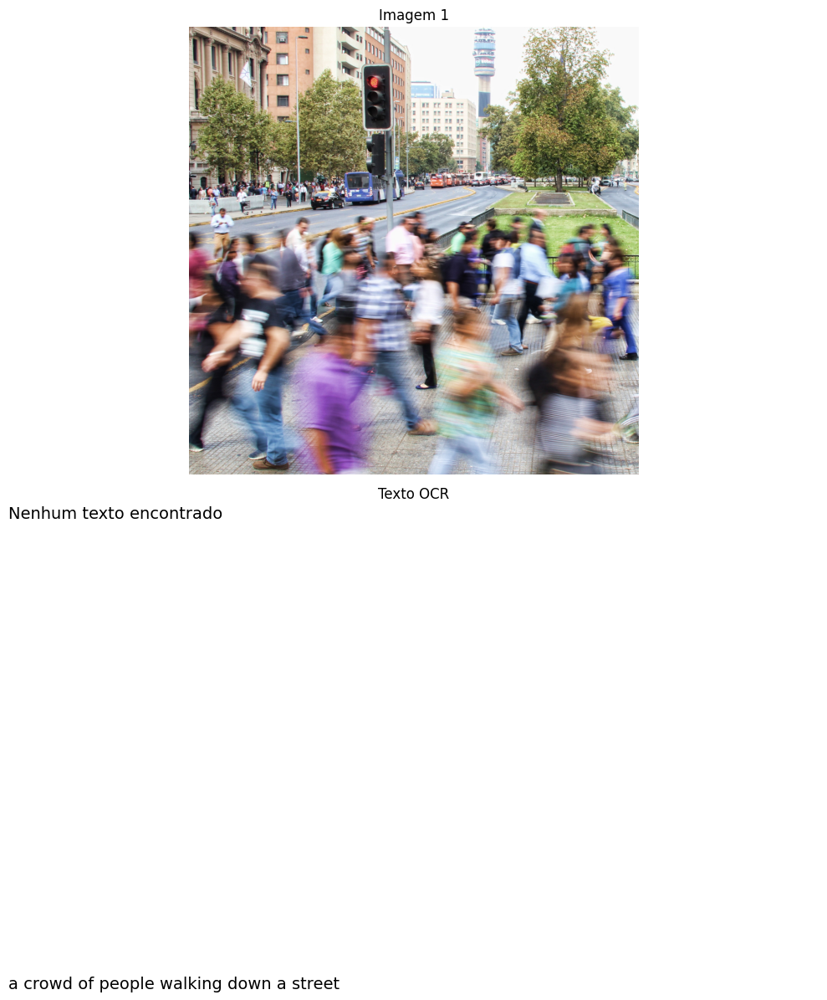

Imagem 2:
Descrição da imagem: the united states logo
Texto extraído: Nenhum texto encontrado


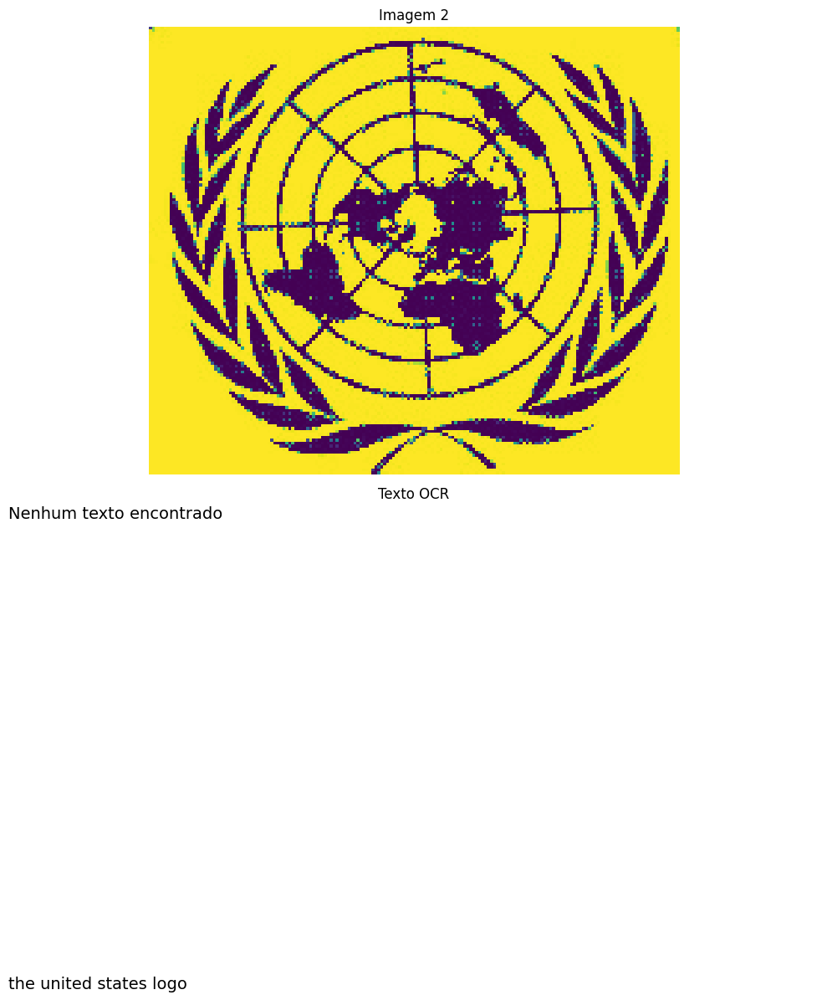

Imagem 3:
Descrição da imagem: a crowd of people holding signs and holding signs
Texto extraído: bals BRING BA TELL YOUR TASTE BUDS TOSTOP SEXTING US. OUR CiIR' 1am20 WOME CO RED LOBSTER am20 SWE MIGHT BE THE YOUNGEST BOLDEST AWO


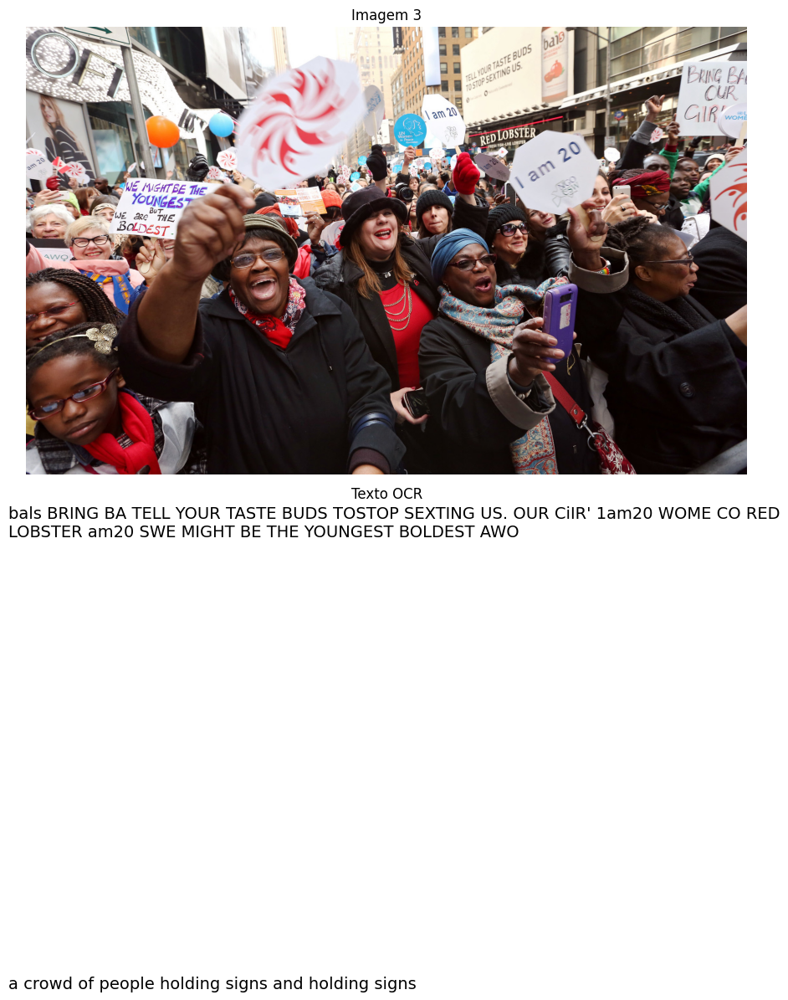

Imagem 4:
Descrição da imagem: a graph shows the growth of the population in the united
Texto extraído: 3.0 95% population prediction intervals  14 Projection 2.5 12 2.0 Growth rate (left axis) 10 1.5 8 1.0 6 0.5 4 Total population (right axis) 0.0 2 -0.5 0 1950 1970 1990 2010 2030 2050 2070 2090 Year


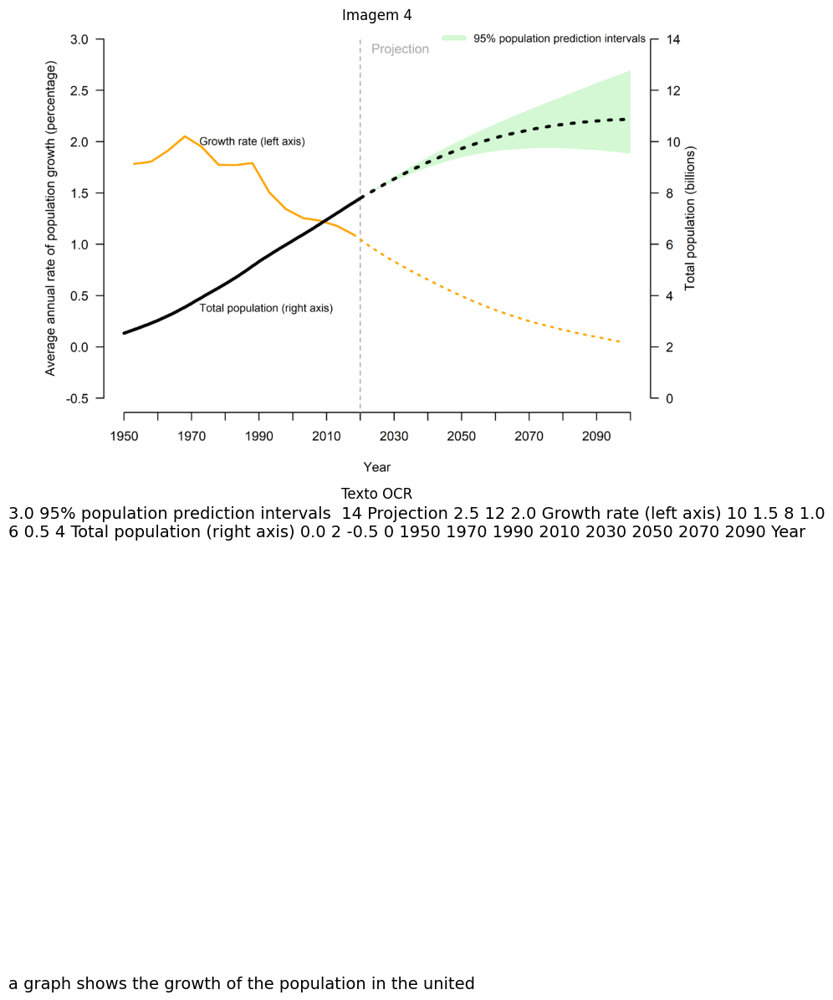

Imagem 5:
Descrição da imagem: the graph shows the number of people in the country
Texto extraído: 5 Projection Sub-Saharan Africa suo!q) 3 Central and Southern Asia Eastern and South-Eastern Asia 2 Europe and Northern America Northern Africa and Western Asia Latin America and the Caribbean Australia/New Zealand Oceania* 0 1950 2000 2050 2100 Year


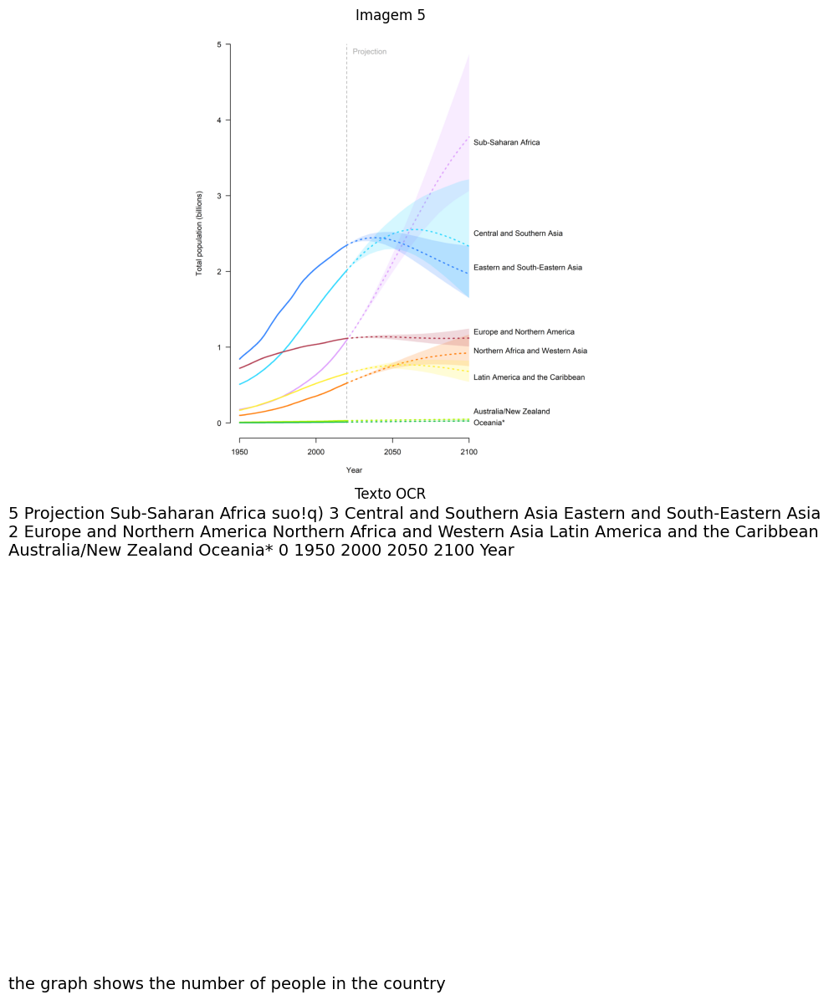

Imagem 6:
Descrição da imagem: a graph with the slope of the slope and the slope of the slope
Texto extraído: 11.0 Medium variant 10.5 Growth due to: 1) fertility above the level required to balance mortality and yield 10.0 zero growth over the long (suoiig) run; and 2) improvements in survival 9.5 Momentum scenario 9.0 Growth due to momentum created by a relatively 8.5 youthful population age structure in 2020 8.0 Population in 2020 7.5 2020 2040 2060 2080 2100 Year


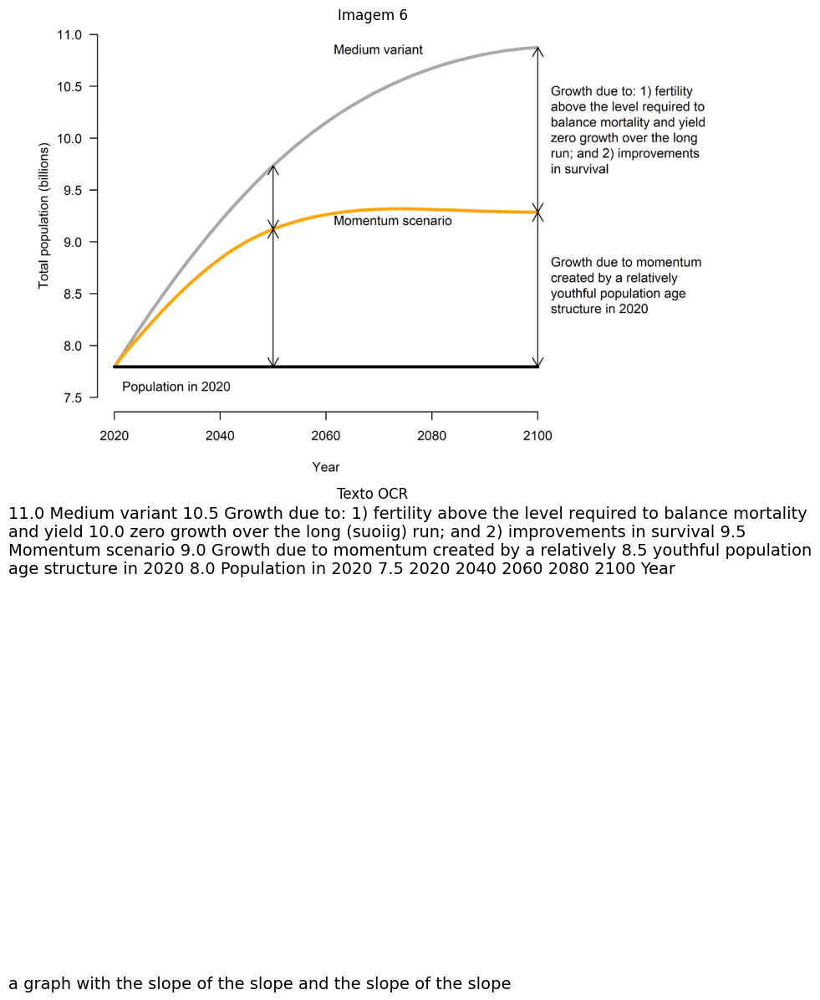

Imagem 7:
Descrição da imagem: a graph showing the number of people who are in the same region
Texto extraído: 9 3.0 Niger 2.5 Angola Dem. Republic of the Congo Mali  United Republic of Tanzania Burundi Zambia Uganda Gambia Benin  Senegal 2.0 Malawi Madagascar Guinea Mauritania Solomon Islands Sao Tome and Princip Sudan South Sudan Guinea-Bissau Rwanda Vanuatu Central African Republic Eritrea Comoros Afghanistan (emen Sierra Leone Timor-Leste 1.5 Kiribati : . Tuvalu Haiti Cambodia Djibouti Lao People's Dem. Republic Nepal  Lesotho Bangladesh Bhutan. Myanmar 1.0 $250 $500 $1,000 $2,000 $4,000 Gross National Income per capita (logarithmic scale) Bubble size is proportional to Central and Southern Asia total population in 2019 Eastern and South-Eastern Asia Sub-Saharan Africa Latin America and the Caribbean o Northern Africa and Western Asia Oceania*


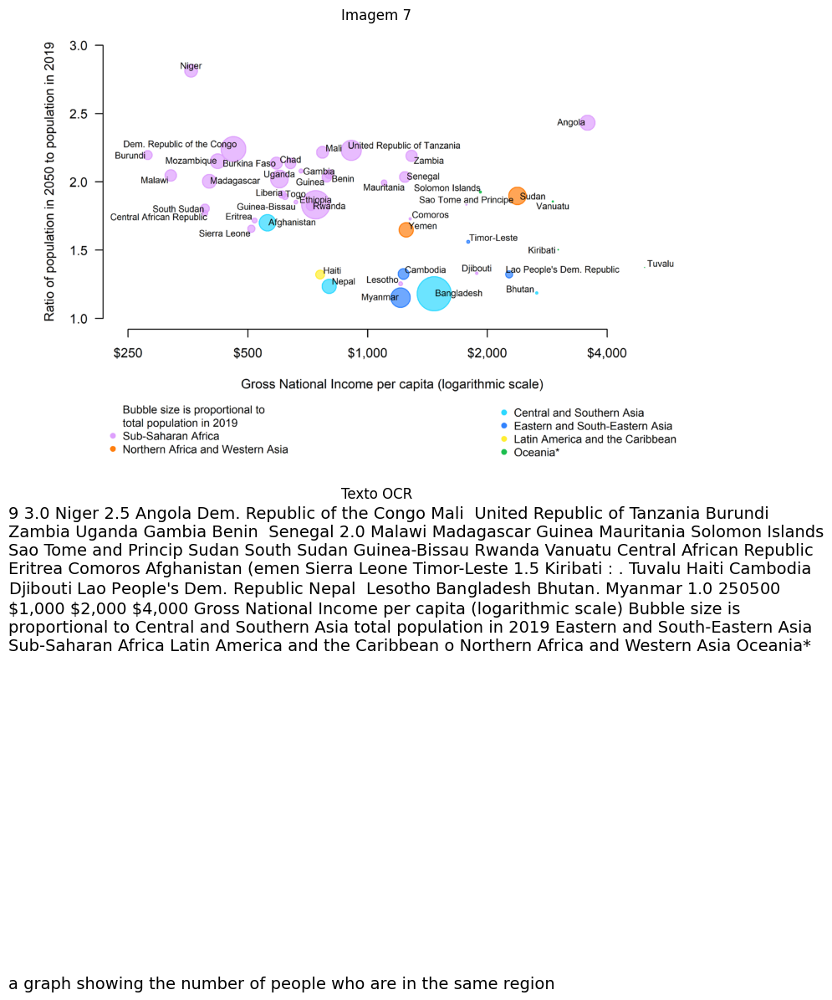

Imagem 8:
Descrição da imagem: a graph showing the number of people who have been reported in the past
Texto extraído: 3.0 Least developed countries Projection 2.5 2.0 Rest of the world. 1.5 1.0 0.5 0.0 -0.5 1950 2000 2050 2100 Year


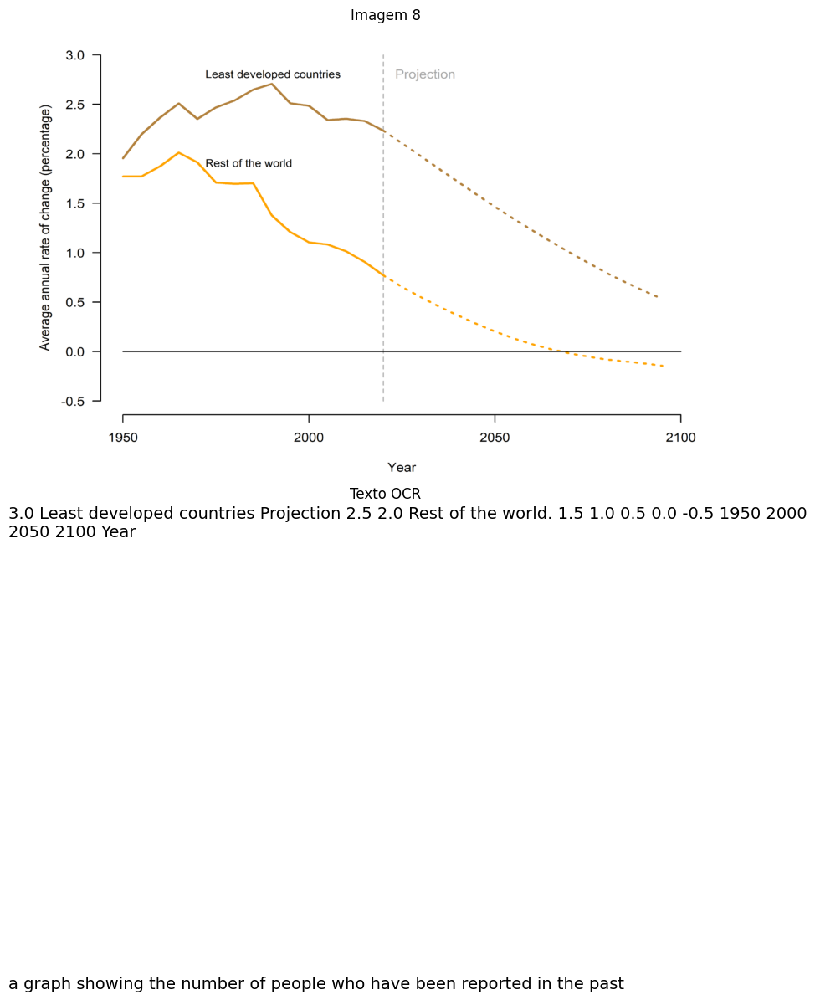

Imagem 9:
Descrição da imagem: the number of people in the world
Texto extraído: 2:0 Sub-Saharan Africa. Northern Africa and Western Asia Central and Southern Asia. Eastern and South-Eastern Asia All other countries. Latin America and the Caribbean Europe and Northern America (siiliig) asns 5. Cote d'!voire Afghanistan Madagascar Mexico  pue Bangladesh Iraq Mozambique Philippines Sudan Kenya Niger Uganda Angola I uoinnnndod u!n 50% United States of America. Egypt  Indonesia United Republic of Tanzania Ppaeeeeee eeeeesse Ethiopia Dem. Republic of the Congo Pakistan 9'0  Nigeria India 0:0


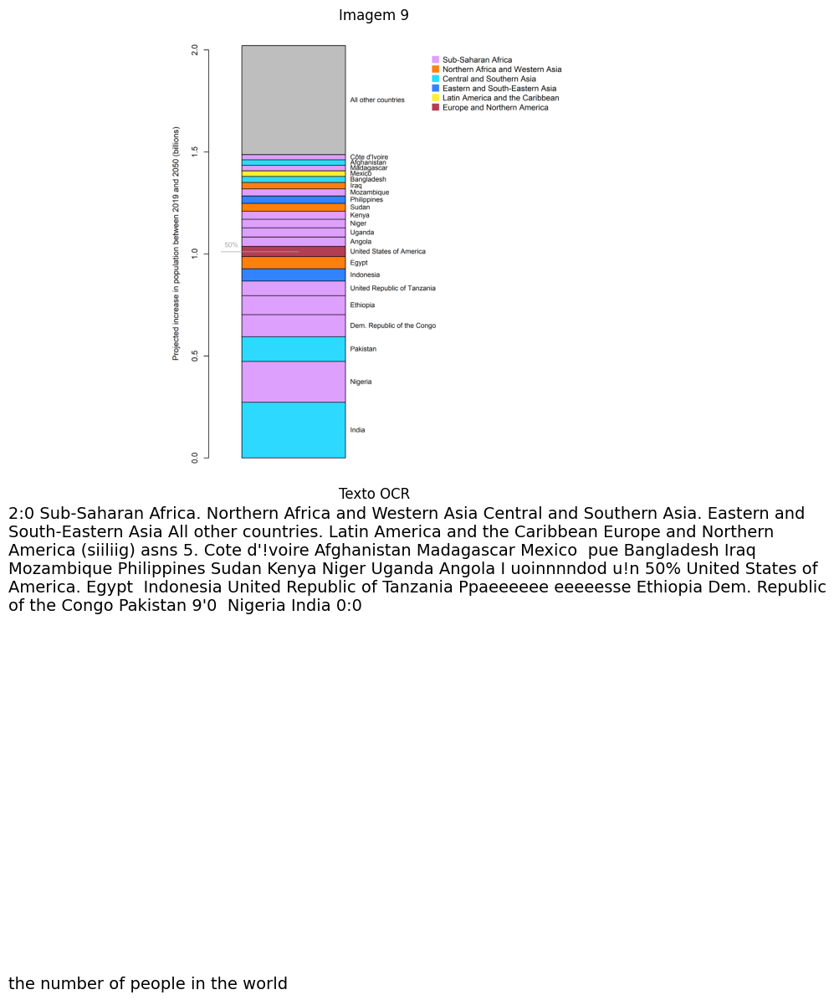

Imagem 10:
Descrição da imagem: a diagram showing the different types of the genome
Texto extraído: 1990 2019 2050 2100 1 China (1,177) China (1,434) India (1,639) India (1,450) 2 India (873)  India (1,366) China (1,402) China (1,065) 3 United States of America (252) United States of America (329) Nigeria (401) Nigeria (733) 4 Indonesia (181)  Indonesia (271) United States of America (379) United States of America (434) 5 Brazil (149) Pakistan (217)  Pakistan (338) Pakistan (403) 6 Russian Federation (148) Brazil (211)  Indonesia (331) Dem. Republic of the Congo (362) 7 Japan (125) Nigeria (201) Brazil (229) Indonesia (321) 8 Pakistan (108) Bangladesh (163) Ethiopia (205) Ethiopia (294) 9 Bangladesh (103)  Russian Federation (146) Dem. Republic of the Congo (194 United Republic of Tanzania (286) 10  Nigeria (95) Mexico (128) Bangladesh (193) Egypt (225) 11 Mexico (84) Japan (127) Egypt (160) 12 Ethiopia (112)  Mexico (155) Brazil (181) 13 14 Russian Federation (136)  Bangladesh (151) 1

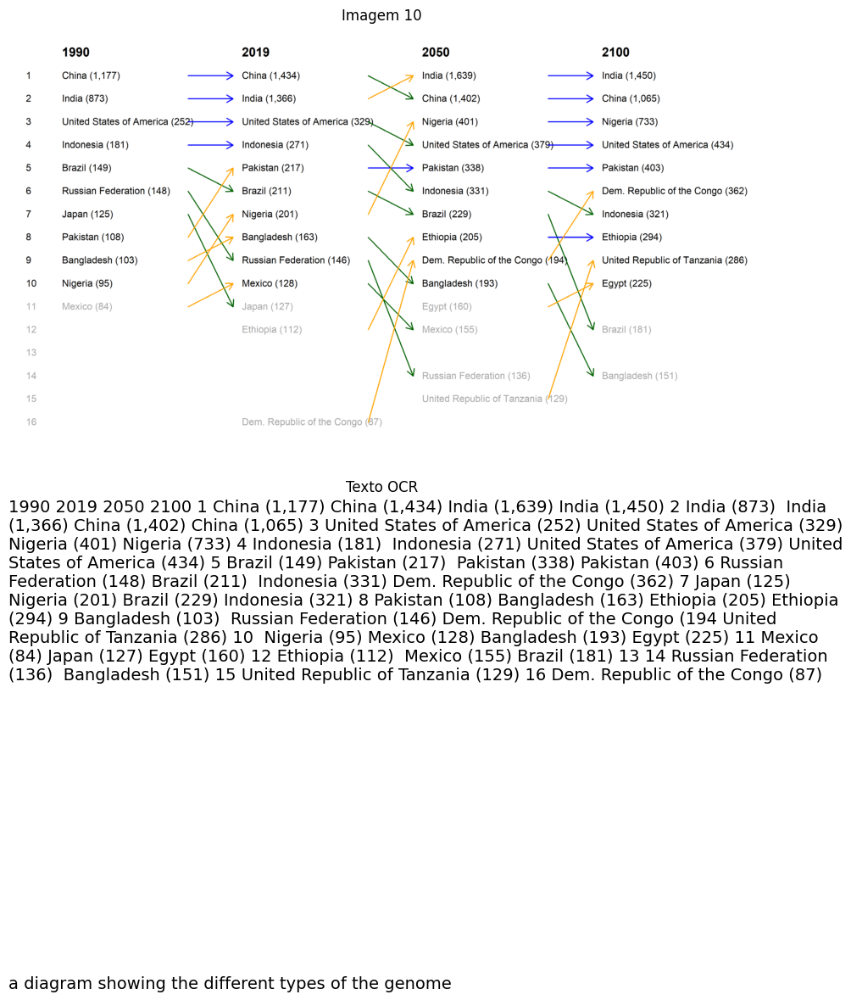

Imagem 11:
Descrição da imagem: a graph showing the number of people who have been diagnosed
Texto extraído: daannnn eannnn pan ainn sannnnin nnn nninn annon Caannnn eons Roonmna Brrrna Geeorga RuebunH ukrnne CGreeee  seria Alana puend faata ueder 5 10- 15- Northern Africa and Western Asia Eastern and South-Eastern Asia Latin America and the Caribbean Oceania* Europe and Northern America 20


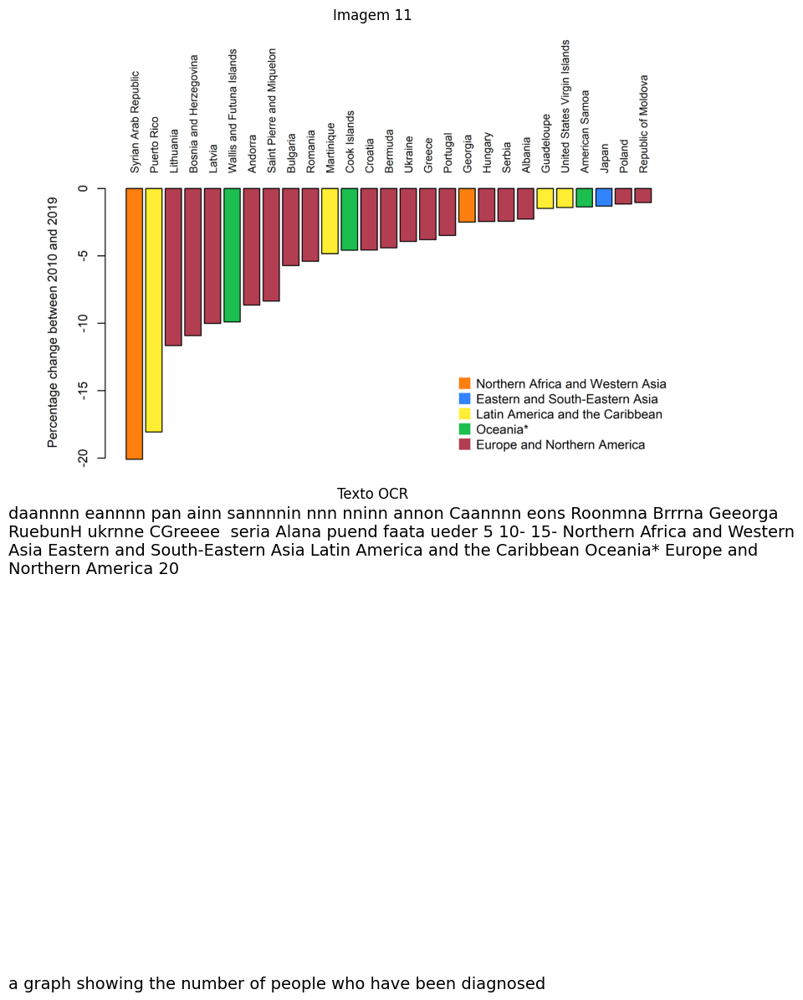

Imagem 12:
Descrição da imagem: a graph of the number of african countries
Texto extraído: daannnn nannng nae dins obeqol  pue anninaa Pu pneeo Brnrnna Muebun  slorrnna Gerrany Doonnlea  uknnnne esnnia Beannns Arnmne  ueder C Greeee  sernla uieds ehnne 10- 15- Sub-Saharan Africa Northern Africa and Western Asia Eastern and South-Eastern Asia 20 Latin America and the Caribbean Oceania* Europe and Northern America


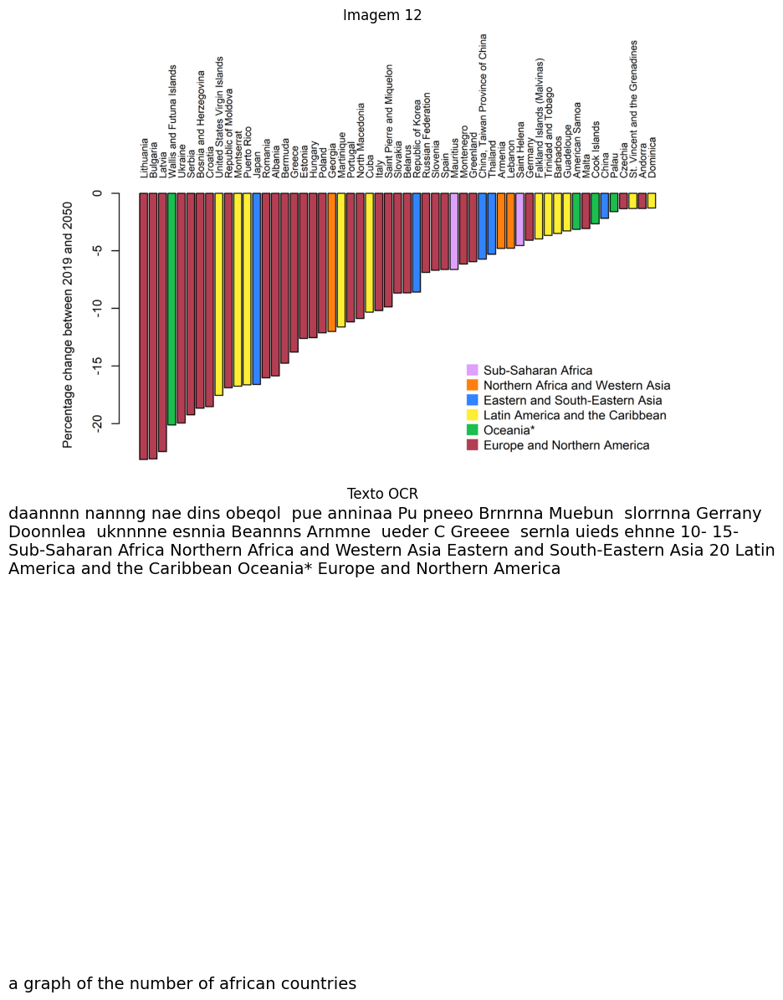

Imagem 13:
Descrição da imagem: a graph showing the number of people in different countries
Texto extraído: 70 Projection 60 Prreeeraee 50 40 30 20 1990 2000 2010 2020 2030 2040 2050 2060 2070 2080 2090 2100 Year Sub-Saharan Africa Latin America and the Caribbean Northern Africa and Western Asia Australia/New Zealand Central and Southern Asia. Oceania* Eastern and South-Eastern Asia Europe and Northern America.


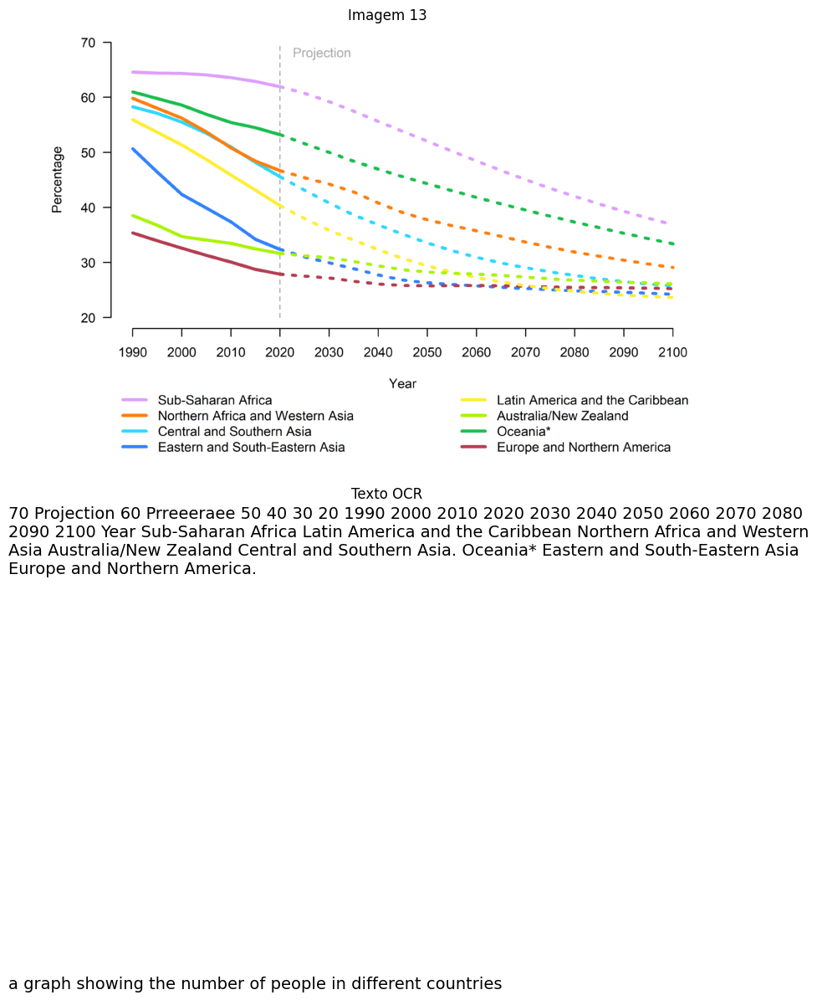

Imagem 14:
Descrição da imagem: a graph of the number of different types of the different species
Texto extraído: 6 Projection 5 (duniig) eoinindnns 3 2 1950 2000 2050 2100 Year Age group 0-4 5-14 15-24 25-64 65 or over


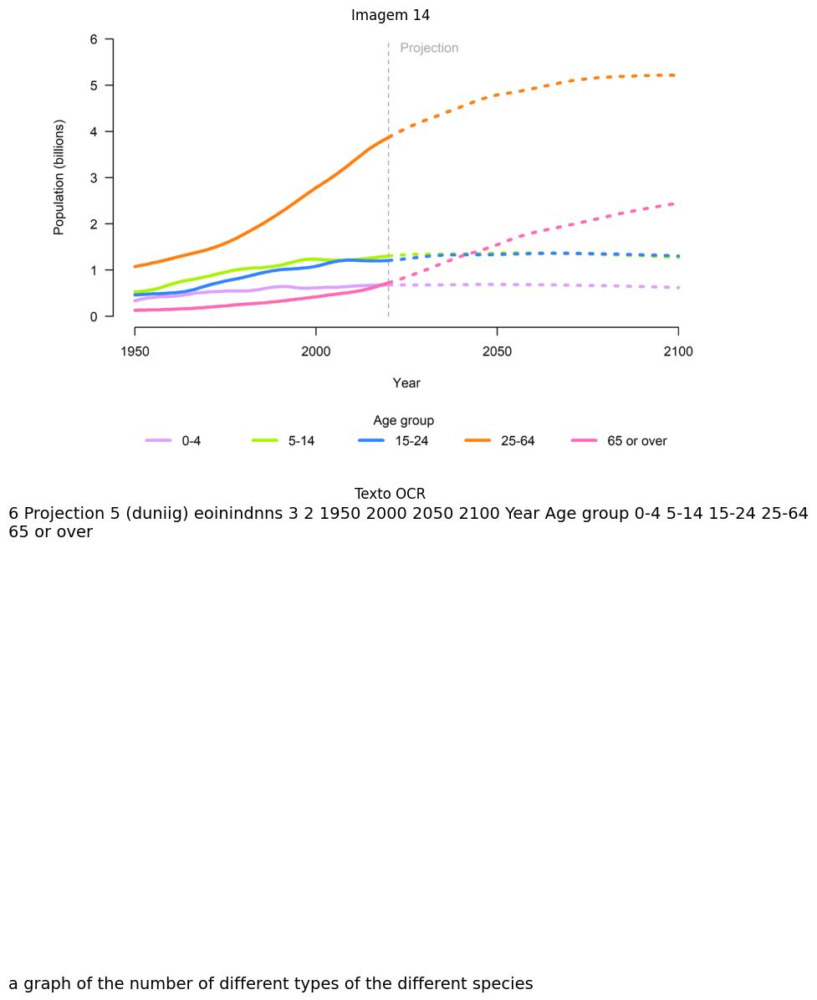

Imagem 15:
Descrição da imagem: a graph showing the number of people in different countries
Texto extraído: 60 Projection 55 50 Prreeeraeee 45 40 35 30 1990 2000 2010 2020 2030 2040 2050 2060 2070 2080 2090 2100 Year Sub-Saharan Africa Latin America and the Caribbean. Northern Africa and Western Asia. Australia/New Zealand Central and Southern Asia. Oceania* Eastern and South-Eastern Asia Europe and Northern America.


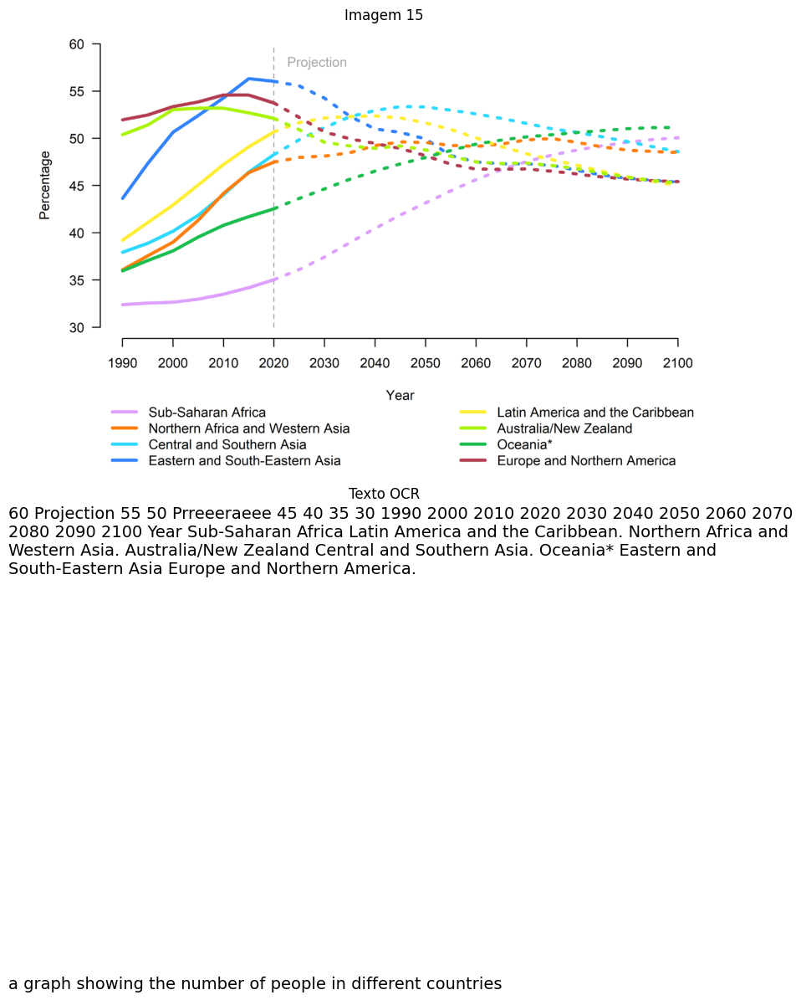

Imagem 16:
Descrição da imagem: a map with the countries that have the highest percentage of people
Texto extraído: Percentage aged 65 years or older 15 or more 10 to less than 15 5 to less than 10 Less than 5 No data


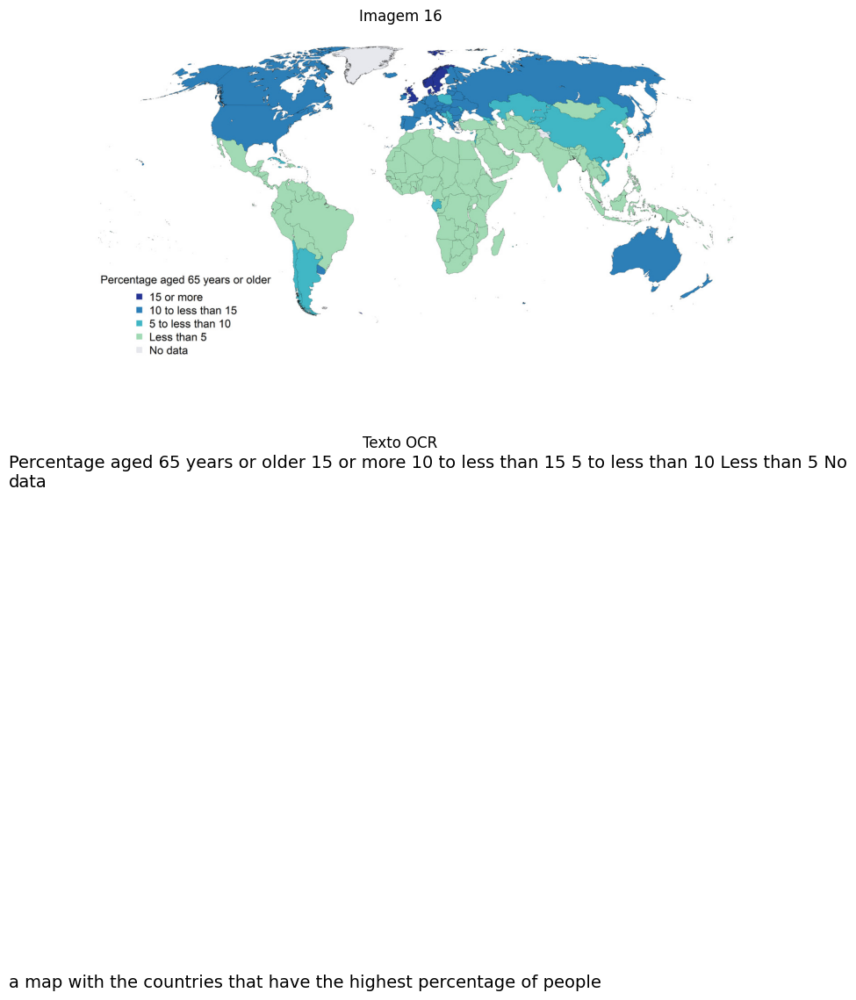

Imagem 17:
Descrição da imagem: a map of the world with countries and countries
Texto extraído: Percentage aged 65 years or older 15 or more 10 to less than 15 5 to less than 10 Less than 5.  No data


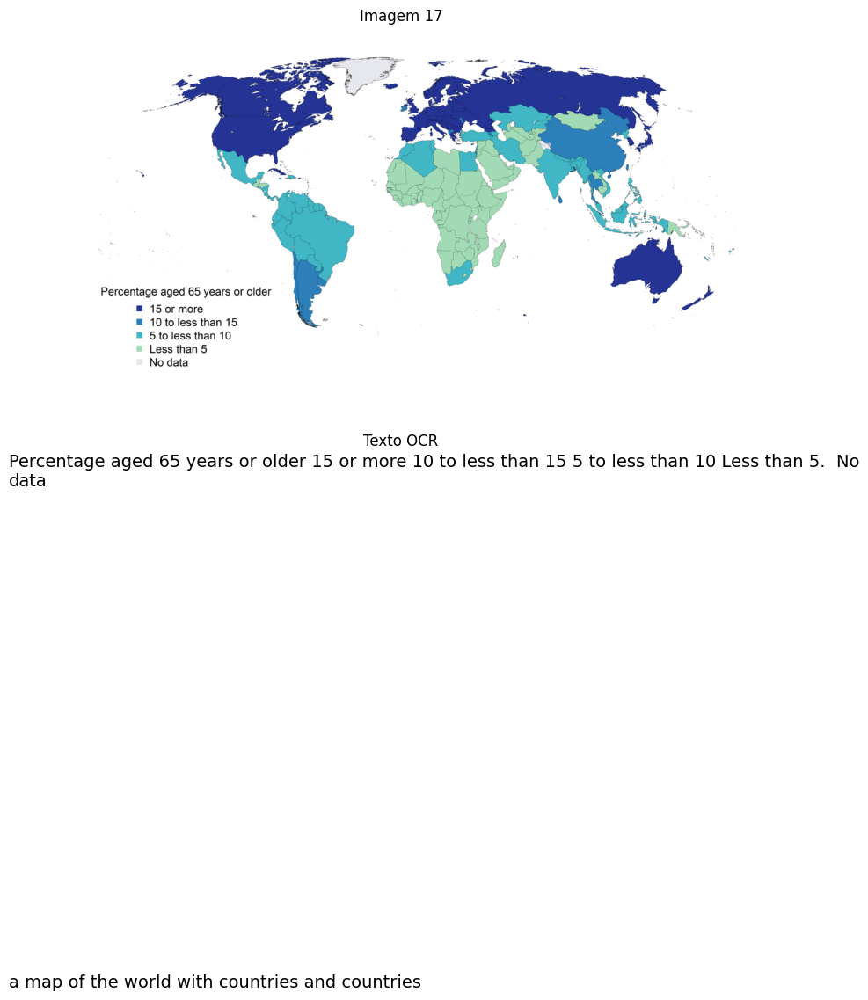

Imagem 18:
Descrição da imagem: a map showing the percentage of people living in each country
Texto extraído: Percentage aged 65 years or older  15 or more 10 to less than 15  5 to less than 10 Less than 5  No data


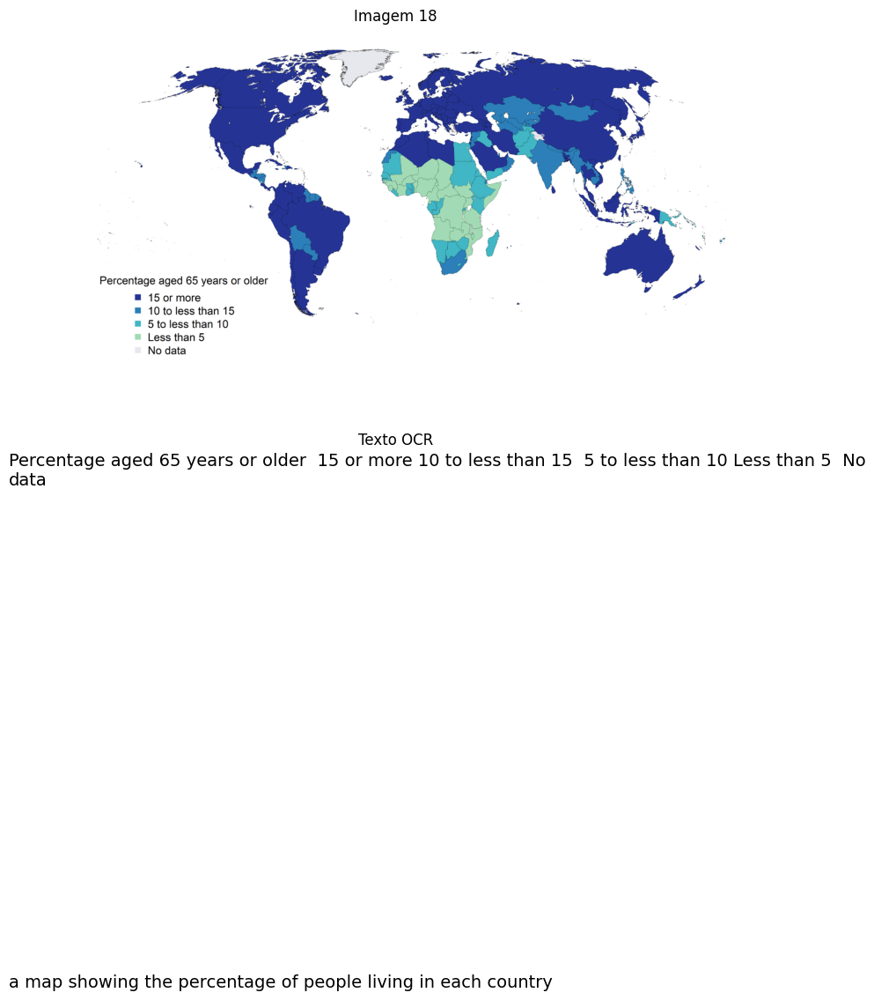

Imagem 19:
Descrição da imagem: a graph showing the number of people in different countries
Texto extraído: 12 rojectior 99 10 8 6 2 0 1990 2000 2010 2020 2030 2040 2050 2060 2070 2080 2090 2100 Year Sub-Saharan Africa Latin America and the Caribbean. Northern Africa and Western Asia. Australia/New Zealand. Central and Southern Asia. Oceania* Eastern and South-Eastern Asia Europe and Northern America.


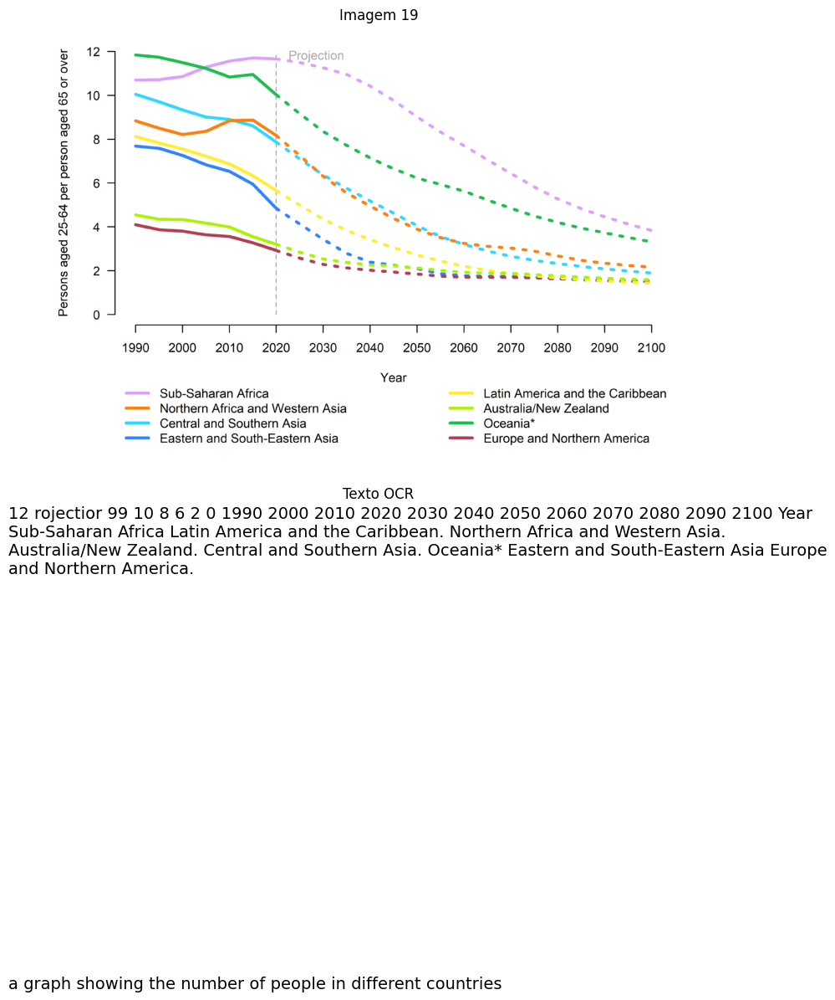

Imagem 20:
Descrição da imagem: a group of people posing for a picture
Texto extraído: Nenhum texto encontrado


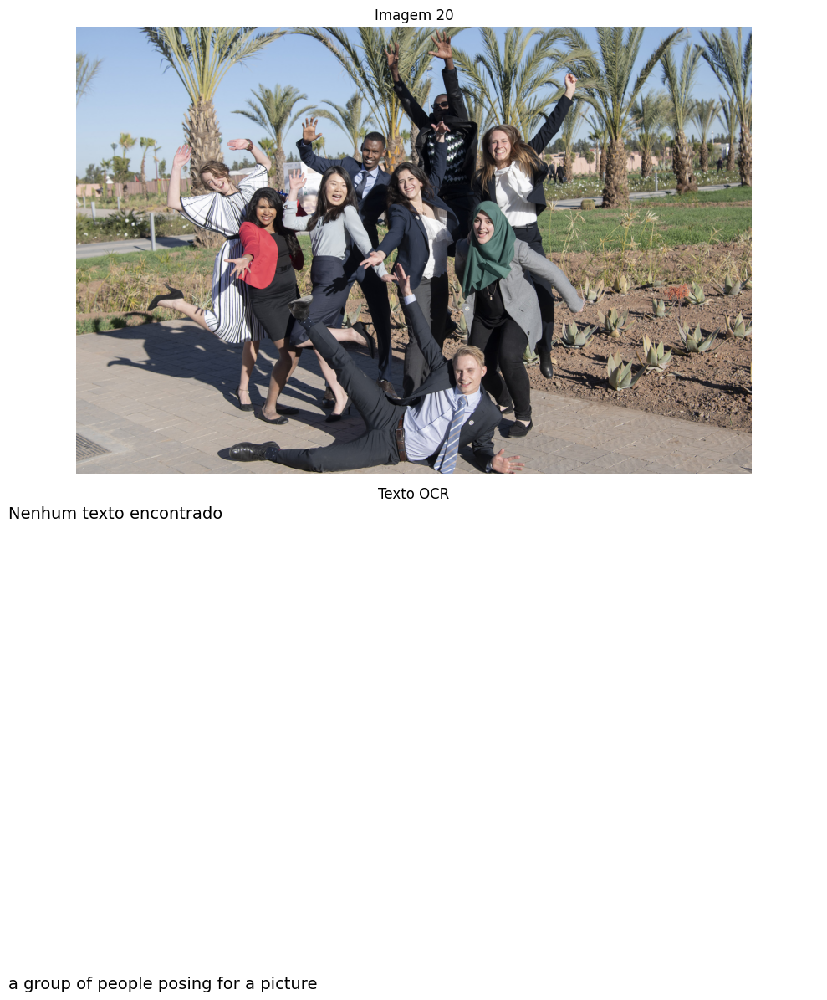

Imagem 21:
Descrição da imagem: a graph of the number of people in the country
Texto extraído:  Projection 6 5 4 3 2 1950 2000 2050 2100 Year Sub-Saharan Africa Latin America and the Caribbean Northern Africa and Western Asia Australia/New Zealand Central and Southern Asia Oceania* Eastern and South-Eastern Asia Europe and Northern America


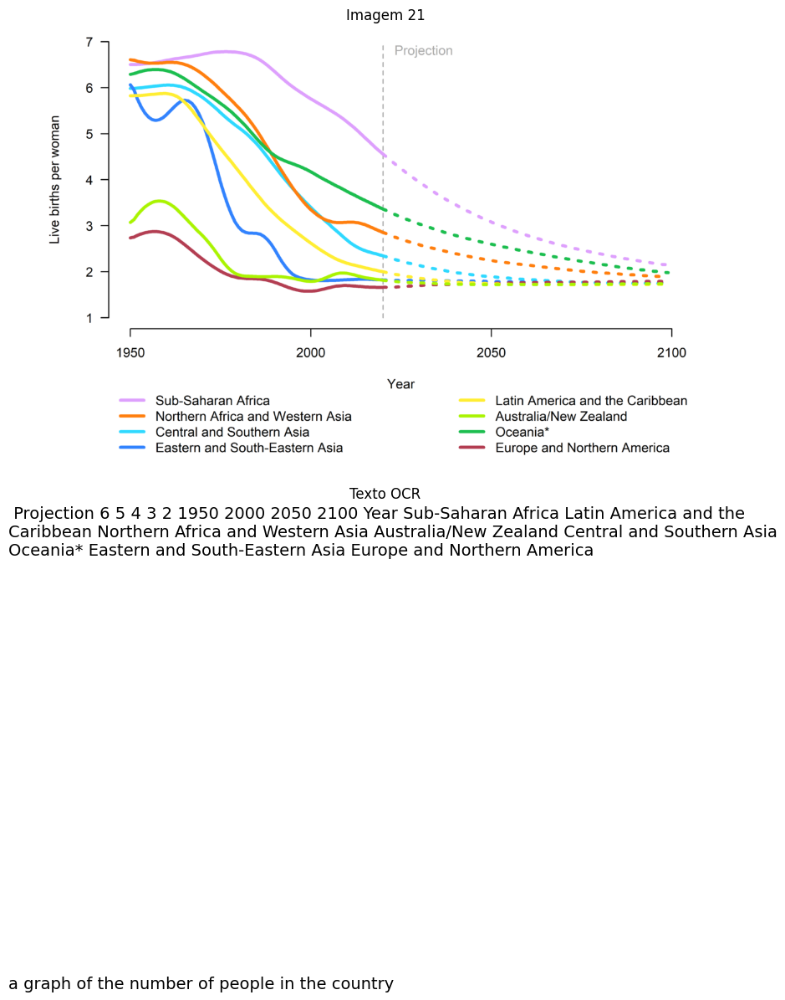

Imagem 22:
Descrição da imagem: a graph showing the number of african countries in the world
Texto extraído: 889 Sub-Saharan Africa 1,365 306 Northern Africa and Western Asia. 347 1,200 Central and Southern Asia. 1,057 965 Eastern and South-Eastern Asia 787 336 Latin America and the Caribbean. 279 1 10 Australia/New Zealand | 12 Oceania* 1 10 366 Europe and Northern America 343 813 Least developed countries 1,122 407 Land-locked Developing Countries (LLDC) 541 39 Small Island Developing States (SIDS) 37 1990-2020 2020-2050 T T 0 200 400 600 800 1000 1200 1400 Births (millions)


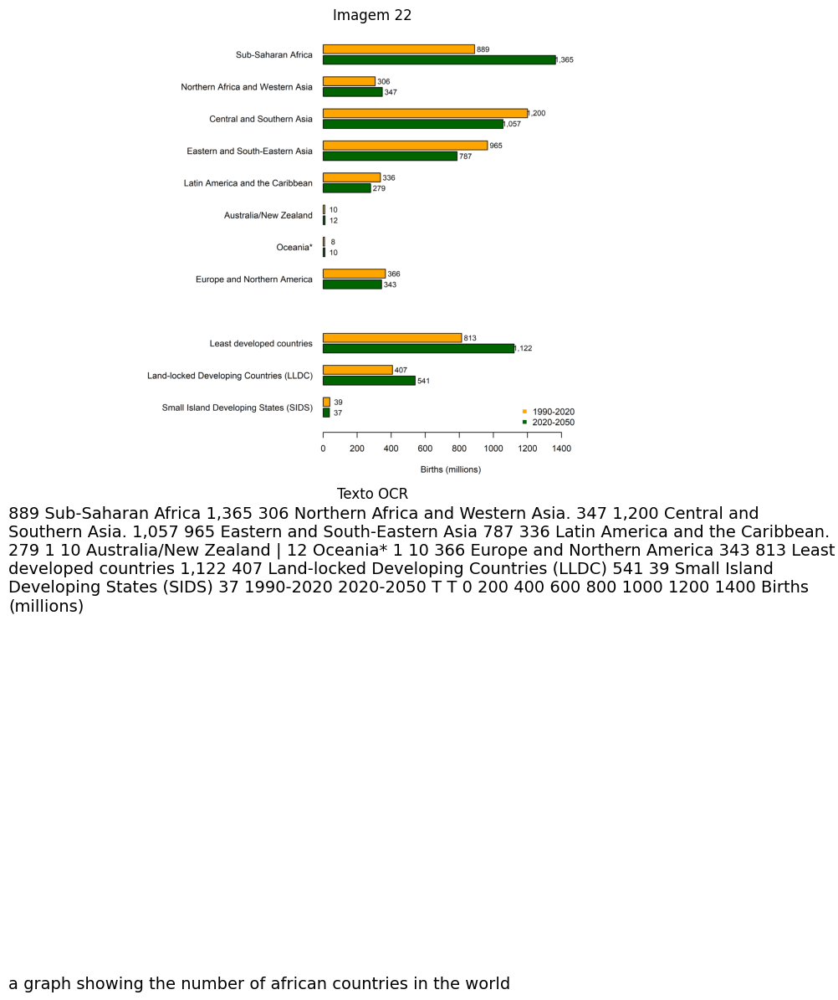

Imagem 23:
Descrição da imagem: a map of the world with the countries in blue
Texto extraído: Live births per woman  4 or more 2.1 to less than 4 1.5 to less than 2.1 Less than 1.5  No data


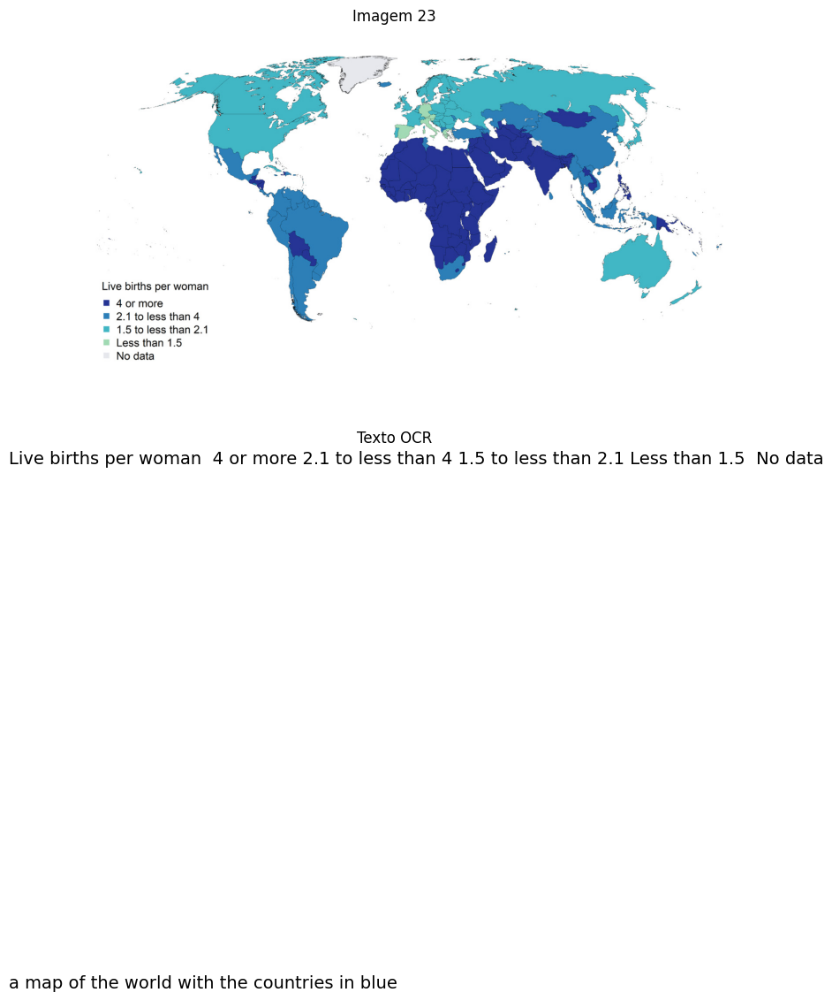

Imagem 24:
Descrição da imagem: a map showing the percentage of people living in each country
Texto extraído: Live births per woman  4 or more 2.1 to less than 4 1.5 to less than 2.1 Less than 1.5 No data


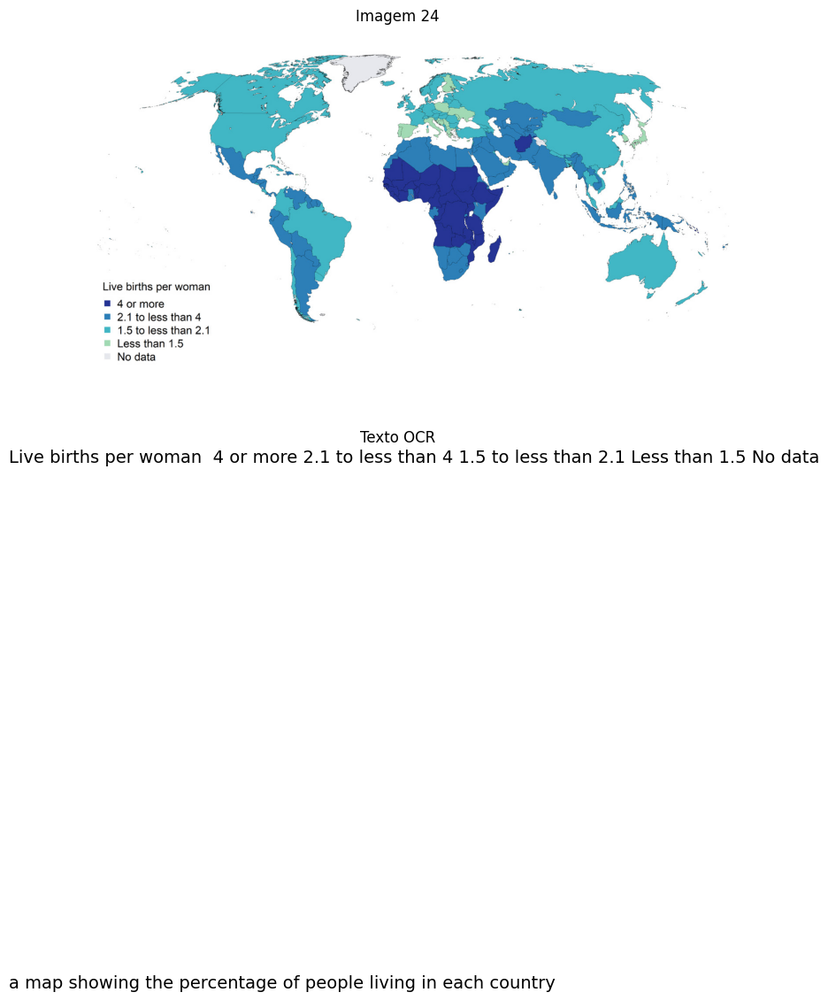

Imagem 25:
Descrição da imagem: a map showing the percentage of people living in each country
Texto extraído: Live births per woman  4 or more 2.1 to less than 4 1.5 to less than 2.1 Less than 1.5  No data


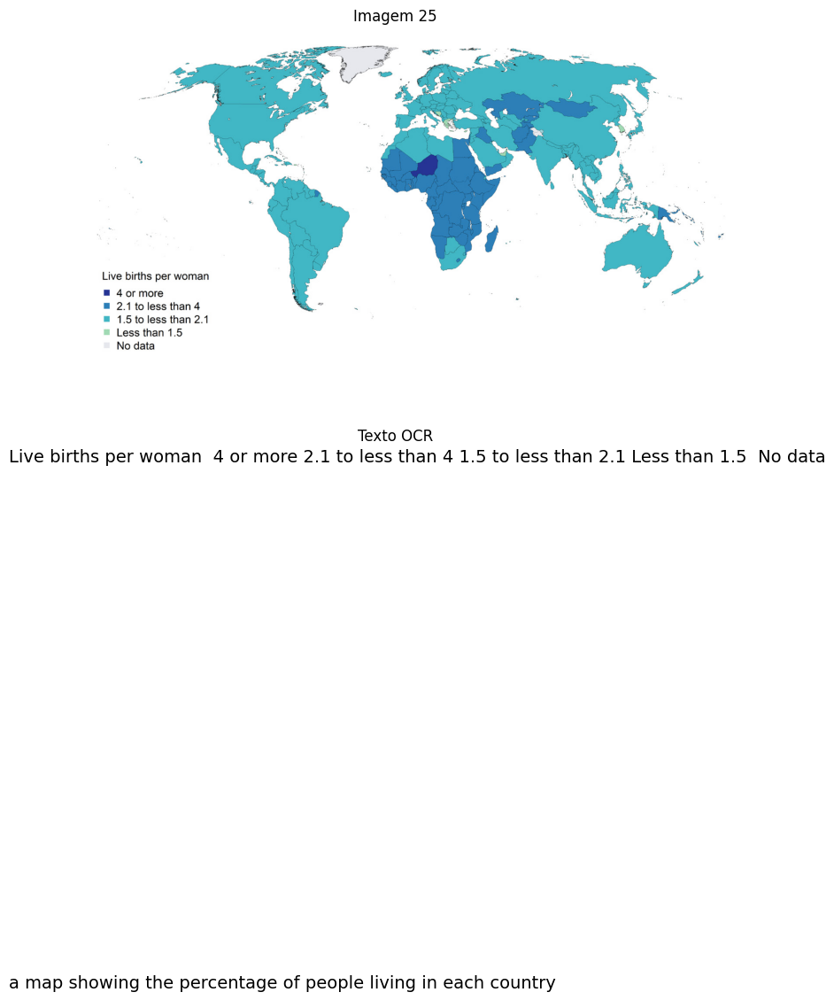

Imagem 26:
Descrição da imagem: a bar graph showing the number of people who have been in the same place
Texto extraído: 100 Live births per woman  4 or more 2.1 to less than 4 1.5 to less than 2.1 Less than 1.5 20 1990 2019 2050


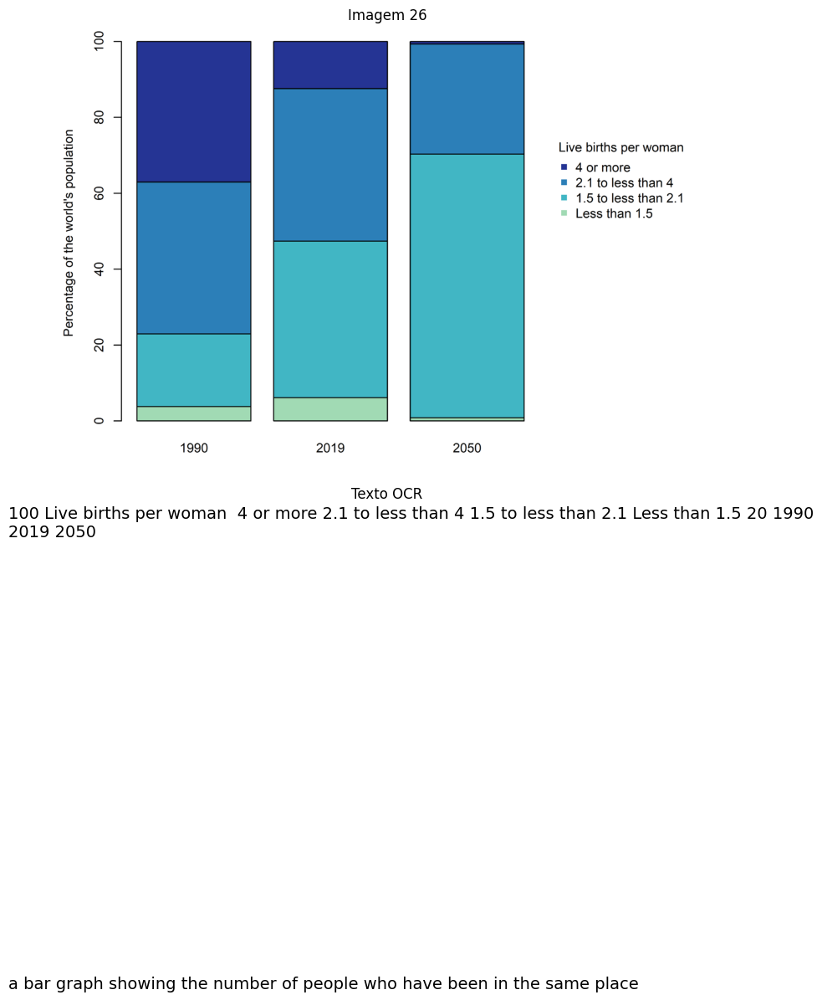

Imagem 27:
Descrição da imagem: a map showing the percentage of people living in each country
Texto extraído: Births per 1,000 women aged 15-19  100 or more  60 to less than 100  30 to less than 60  Less than 30  No data


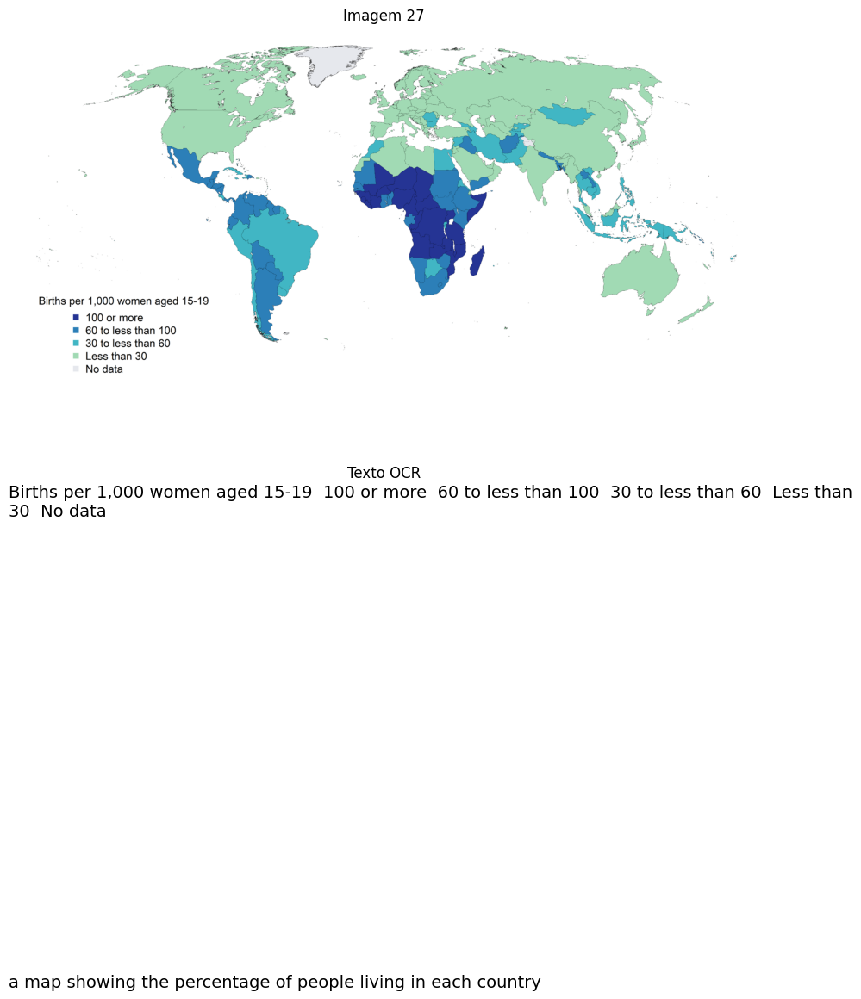

Imagem 28:
Descrição da imagem: a graph showing the number of different countries in the world
Texto extraído: 100 Projection 90 (reens)s 80  eeae ee ereeeaeee 70 60 50 fee 40 30 1950 2000 2050 2100 Year Sub-Saharan Africa Latin America and the Caribbean Northern Africa and Western Asia Australia/New Zealand Central and Southern Asia Oceania* Eastern and South-Eastern Asia Europe and Northern America


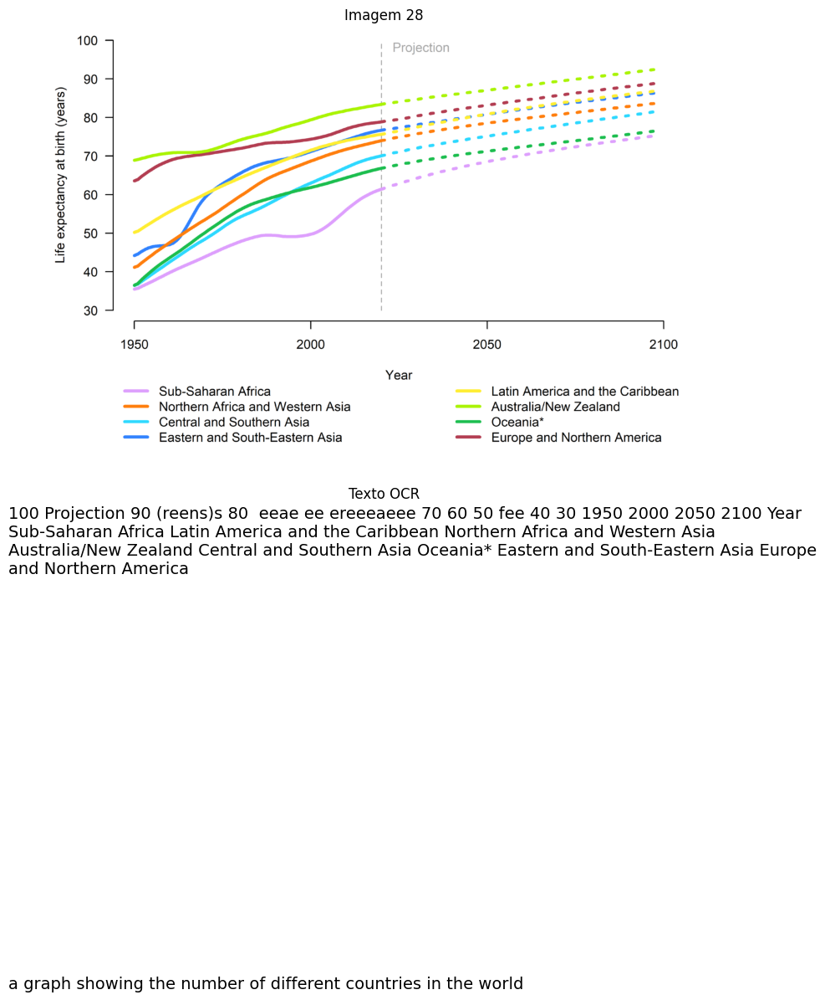

Imagem 29:
Descrição da imagem: the number of different countries in the world
Texto extraído: World 38.4 Sub-Saharan Africa 74.2 Northern Africa and Western Asia 25.8 Central and Southern Asia 41.2 Eastern and South-Eastern Asia.. 15.6 Latin America and the Caribbean. 18.4 Australia/New Zealand 3.7 Oceania* 43.6 Europe and Northern America. 5.5 Least developed countries 64.8 Land-locked Developing Countries (LLDC) 58.8 Small Island Developing States (SIDS). 41 - 0 20 40 60 80 Deaths under age five per 1,o0o live births


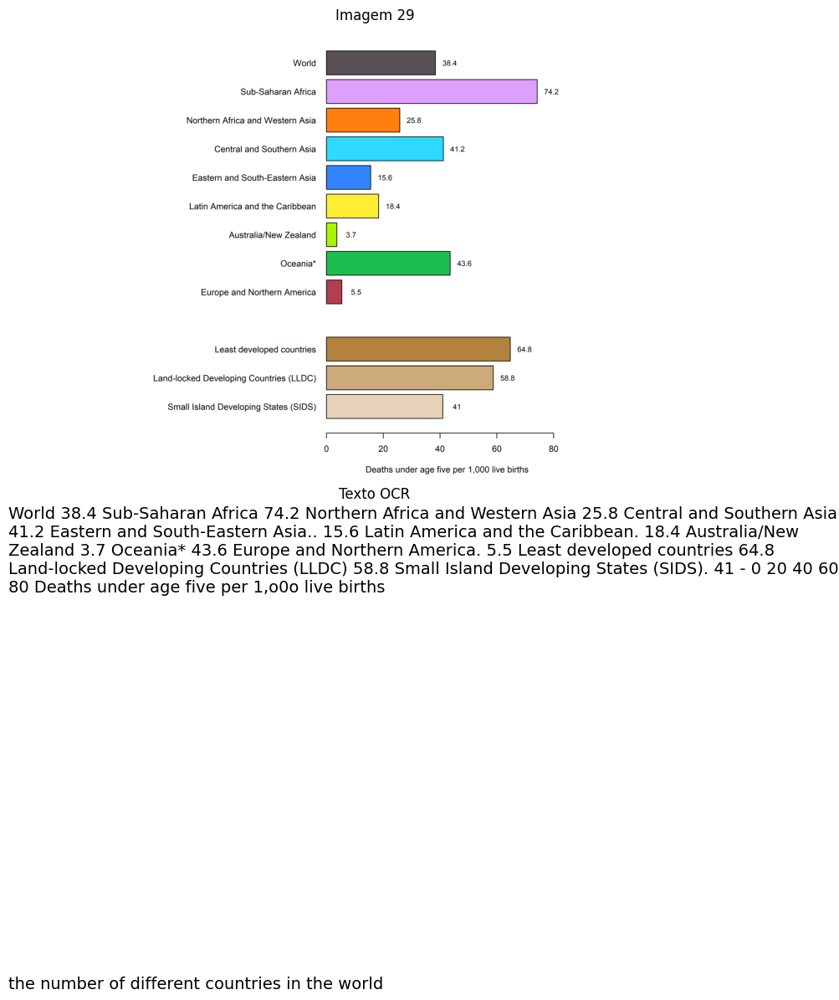

Imagem 30:
Descrição da imagem: the number of people who are in the world
Texto extraído: Female 16 18 ) World Male 16 18 Female 13 15 Sub-Saharan Africa Male 12 Female 15 17 Northern Africa and Western Asia Male Female Central and Southern Asia Male Female 16 Eastern and South-Eastern Asia Male 5 Female Latin America and the Caribbean. Male Female Australia/New Zealand Male 20 Female 11 Oceania* Male 10 12 13 Female 18 20 Europe and Northern America Male Life expectancy at age 65 (years) 1990-1995 2015-2020 2045-2050


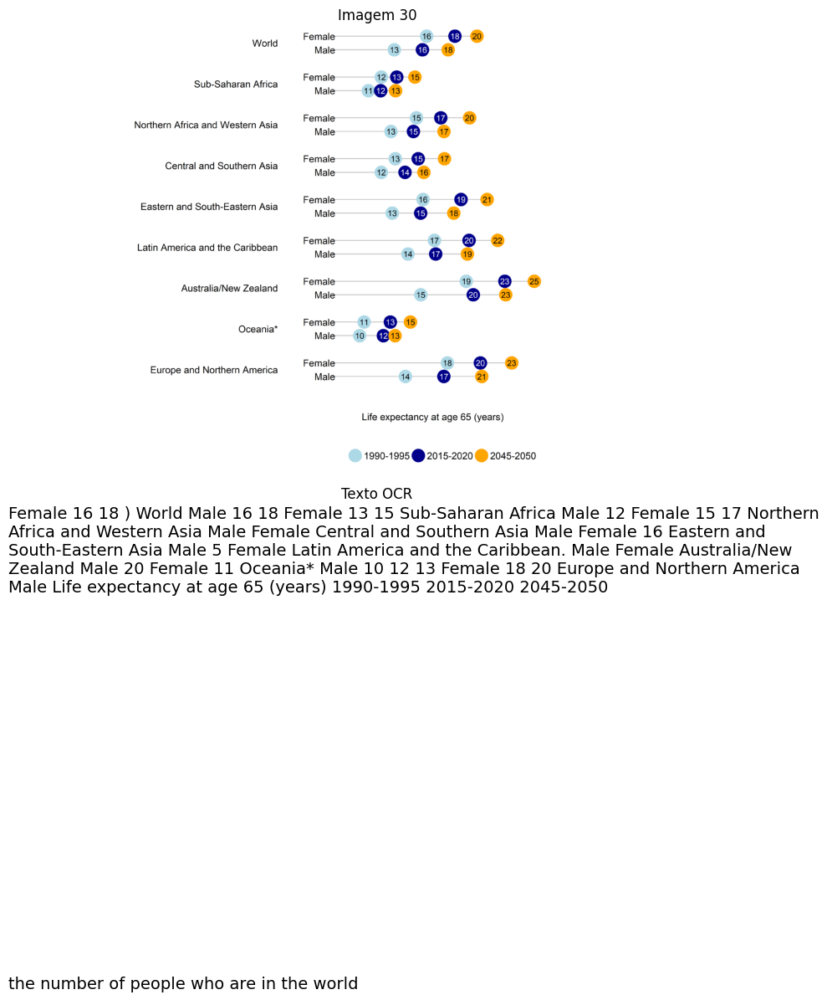

Imagem 31:
Descrição da imagem: the number of people in the united and the number of people in the united
Texto extraído: 20 20 1980-1990 1990-2000 2000-2010 2010-2020 Decade Sub-Saharan Africa. Latin America and the Caribbean Northern Africa and Western Asia Australia/New Zealand Central and Southern Asia Oceania* Eastern and South-Eastern Asia Europe and Northern America


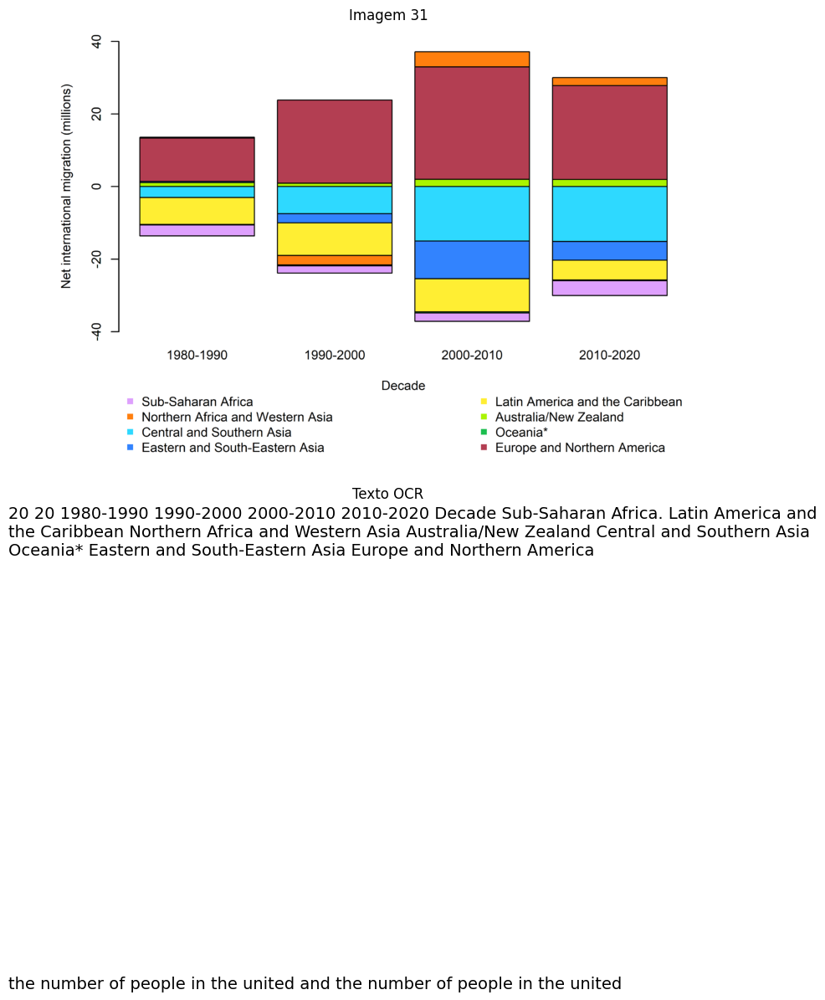

Imagem 32:
Descrição da imagem: a graph showing the average cost of a business
Texto extraído: 10 United States of America 5 (sunii) Turkey Russian Federatione United Kingdom  Saudi Arabia  South Africa Aus stralia Traq  Oman Jordan Lebanon 0 Zimbabwe Philipp  Myanmar Nepal Pakistan China Venezuela (Bolivarian Republic of) Bangladesh India -5  Syrian Arab Republic. -10 Low income Lower-middle Upper-middle High income income income $150 $400 $1,000 $3,000 $8,000 $20,000 $60,000 $160,000 Gross National Income per capita (logarithmic scale) Bubble size is proportional to. Eastern and South-Eastern Asia. total population in 2019 Latin America and the Caribbean.  Sub-Saharan Africa. Australia/New Zealand o Northern Africa and Western Asia. Oceania* Central and Southern Asia Europe and Northern America.


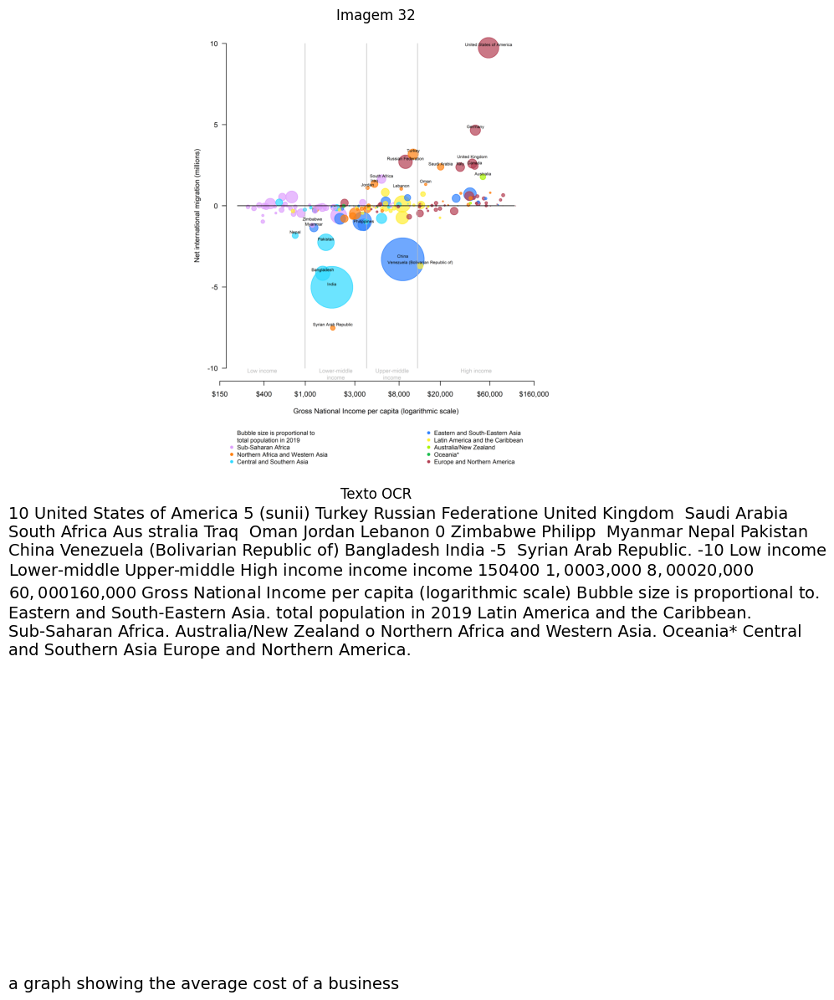

Imagem 33:
Descrição da imagem: a map of the world with different countries
Texto extraído: + Net International Migration


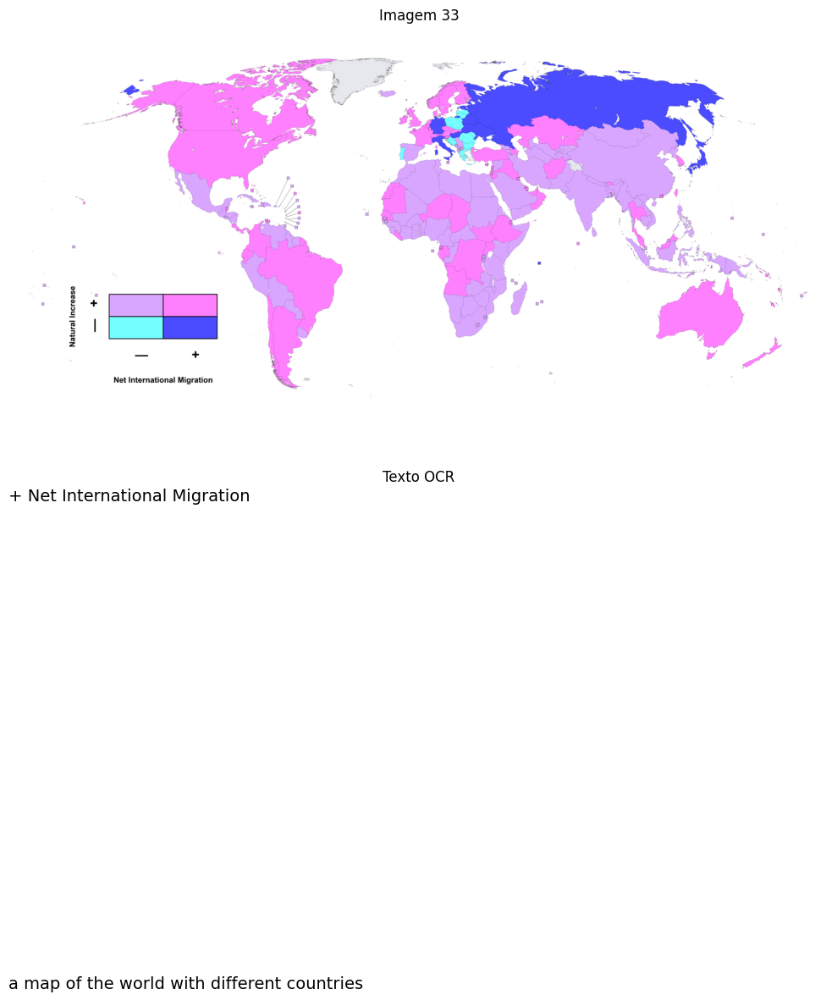

Imagem 34:
Descrição da imagem: sustainable goals sustainable goals sustainable goals sustainable goals sustainable goals sustainable goals sustainable goals sustainable goals sustainable goals sustainable goals
Texto extraído: SUSTA NABLE GOALS DEVELOPMENT NO ZERO 3 GOOD HEALTH 4 QUALITY 5 GENDER 6 CLEAN WATER POVERTY HUNGER AND WELL-BEING EDUCATION EQUALITY AND SANITATION sss 4 - AFFORDABLE AND 8 DECENT WORK AND 9 INDUSTRY, INNOVATION 10 REDUCED  SUSTAINABLE CITIES 12 RESPONSIBLE CLEAN ENERGY ECONOMIC GROWTH ANDINERASTRUCTURE INEQUALITIES CONSUMPTION ANDPRODUCTION GO 13 CLIMATE 14 LIFE 15 LIFE 16 PEACE, JUSTICE 17 PARTNERSHIPS ACTION BELOW WATER ON LAND AND STRONG FOR THE GOALS INSTITUTIONS SUSTAINABLE DEVELOPMENT GOALS


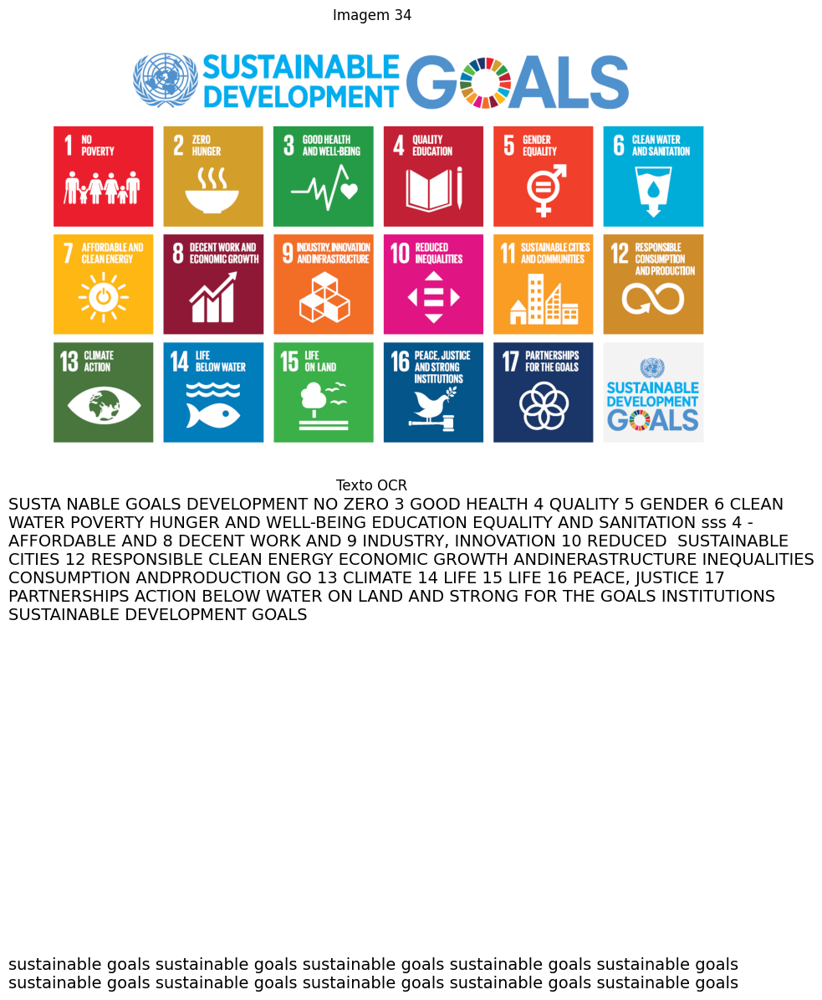

Imagem 35:
Descrição da imagem: a barcode with the text, ' ' ' '
Texto extraído: 9 789211483161


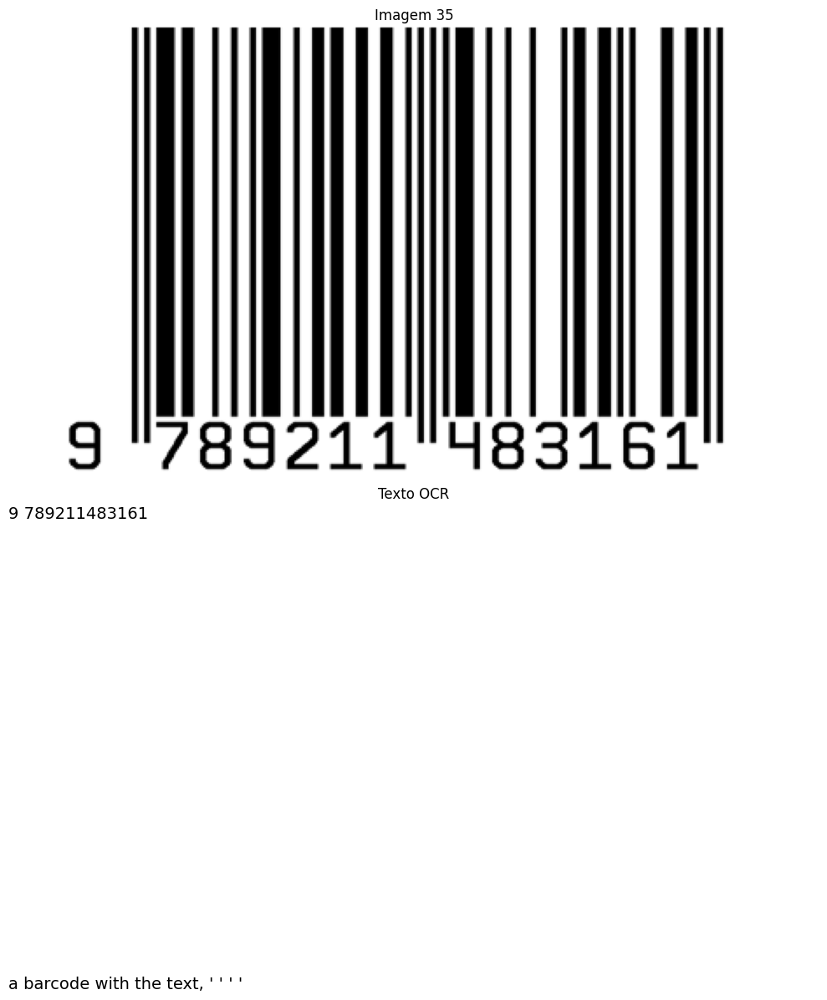

Imagem 36:
Descrição da imagem: a building with a large display of colorful windows
Texto extraído: M Ebe 1 2 12 SSS 20 CO SSS 3 11 4 10 3 9 3 8 4 M M 5 15 8 M 13 12 11 10 10 8


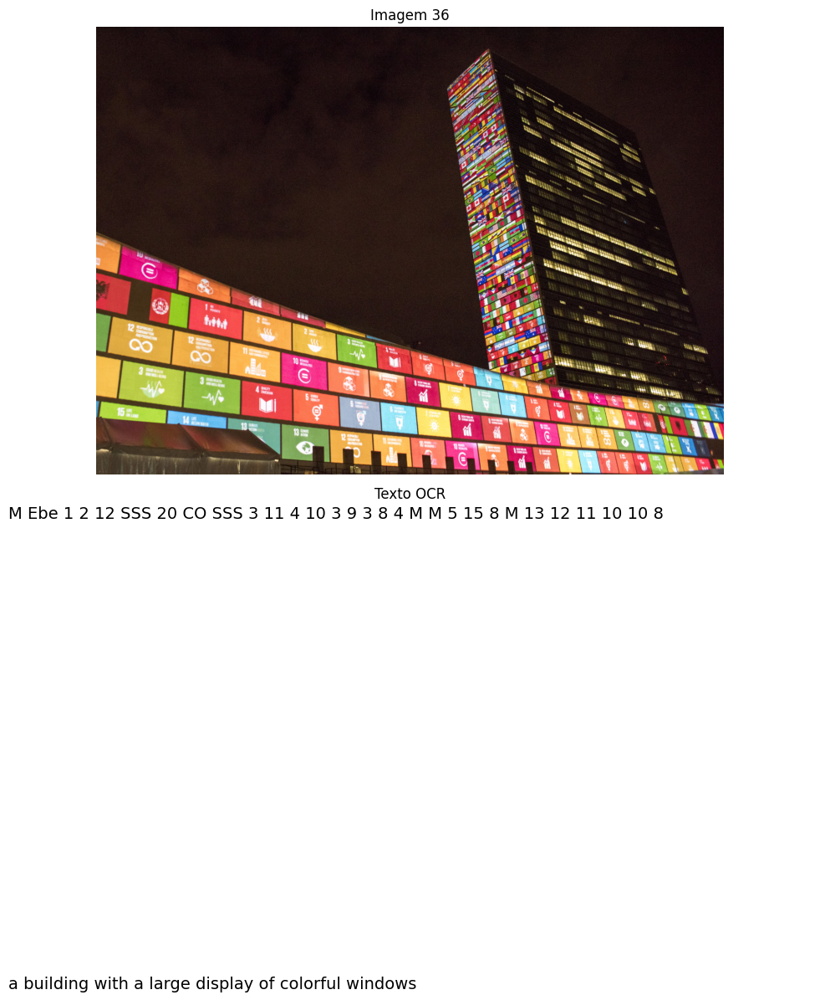

In [68]:
process_pdf("arquivo.pdf")